In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from ta.trend import EMAIndicator, ADXIndicator
from ta.momentum import RSIIndicator

import os, glob, warnings
warnings.filterwarnings("ignore")

plt.style.use("seaborn-v0_8")


In [4]:
EMA_FAST = 13
EMA_SLOW = 34
RSI_PERIOD = 14
ADX_PERIOD = 14

VOLUME_MULTIPLIER = 1.2
ADX_THRESHOLD = 25
RISK_REWARD = 2

CAPITAL_INDEX = 500000
CAPITAL_STOCK = 100000

DATA_PATH = "data/split/"
INDICES = ["NIFTY", "BANKNIFTY", "FINNIFTY"]


In [7]:
def load_csv_safely(file):
    df = pd.read_csv(file)

    # reset index if date is index
    if df.index.name is not None:
        df.reset_index(inplace=True)

    # detect date column
    date_col = None
    for col in df.columns:
        if col.lower() in ["date", "datetime", "time", "timestamp"]:
            date_col = col
            break

    if date_col is None:
        raise ValueError(f"No date column in {file}")

    df["Date"] = pd.to_datetime(df[date_col])
    df = df.sort_values("Date").reset_index(drop=True)

    df.columns = [c.strip().capitalize() for c in df.columns]

    required = ["Open", "High", "Low", "Close", "Volume"]
    for col in required:
        if col not in df.columns:
            raise ValueError(f"{col} missing in {file}")

    return df


In [8]:
def add_indicators(df):
    df["EMA13"] = EMAIndicator(df["Close"], EMA_FAST).ema_indicator()
    df["EMA34"] = EMAIndicator(df["Close"], EMA_SLOW).ema_indicator()
    df["RSI"] = RSIIndicator(df["Close"], RSI_PERIOD).rsi()

    df["VOL_AVG"] = df["Volume"].rolling(20).mean()
    df["ADX"] = ADXIndicator(df["High"], df["Low"], df["Close"], ADX_PERIOD).adx()

    return df.dropna().reset_index(drop=True)


In [9]:
def get_signal(row, inst_type):

    long_cond = (
        row["EMA13"] > row["EMA34"] and
        row["RSI"] > 50 and
        row["Close"] > row["EMA34"]
    )

    short_cond = (
        row["EMA13"] < row["EMA34"] and
        row["RSI"] < 50 and
        row["Close"] < row["EMA34"]
    )

    if inst_type == "stock":
        if long_cond and row["Volume"] > VOLUME_MULTIPLIER * row["VOL_AVG"]:
            return 1
        return 0

    if inst_type == "index":
        if row["ADX"] > ADX_THRESHOLD:
            if long_cond:
                return 1
            if short_cond:
                return -1
        return 0


In [10]:
def backtest(df, symbol, inst_type):
    trades = []
    position = 0

    for i in range(1, len(df)):
        prev, row = df.iloc[i-1], df.iloc[i]
        signal = get_signal(prev, inst_type)

        # ENTRY
        if position == 0 and signal != 0:
            entry = row["Open"]
            sl = prev["EMA34"]

            target = entry + RISK_REWARD * (entry - sl) if signal == 1 else entry - RISK_REWARD * (sl - entry)

            position = signal
            trades.append({
                "Symbol": symbol,
                "Type": inst_type,
                "Direction": "LONG" if signal == 1 else "SHORT",
                "Entry Date": row["Date"],
                "Entry": entry,
                "SL": sl,
                "Target": target,
                "Exit Date": None,
                "Exit": None,
                "Result": None,
                "PnL": 0
            })

        # EXIT
        elif position != 0:
            trade = trades[-1]
            exit_price, reason = None, None

            if position == 1:
                if row["Low"] <= trade["SL"]:
                    exit_price, reason = trade["SL"], "SL"
                elif row["High"] >= trade["Target"]:
                    exit_price, reason = trade["Target"], "TARGET"

            if position == -1:
                if row["High"] >= trade["SL"]:
                    exit_price, reason = trade["SL"], "SL"
                elif row["Low"] <= trade["Target"]:
                    exit_price, reason = trade["Target"], "TARGET"

            if exit_price is not None:
                trade["Exit Date"] = row["Date"]
                trade["Exit"] = exit_price
                trade["Result"] = reason

                if inst_type == "index":
                    ret = position * ((exit_price - trade["Entry"]) / trade["Entry"])
                    trade["PnL"] = CAPITAL_INDEX * ret
                else:
                    qty = CAPITAL_STOCK / trade["Entry"]
                    trade["PnL"] = (exit_price - trade["Entry"]) * qty

                position = 0

    return pd.DataFrame(trades)


In [ ]:
# CELL 7 — RUN BACKTEST

all_trades = []

files = glob.glob(os.path.join(DATA_PATH, "*.csv"))
print(f"Found {len(files)} instruments")

for file in files:
    symbol = os.path.basename(file).replace(".csv", "")
    print("Running:", symbol)

    df = load_csv_safely(file)
    df = add_indicators(df)

    inst_type = "index" if symbol in INDICES else "stock"
    trades = backtest(df, symbol, inst_type)

    if trades is not None and len(trades) > 0:
        all_trades.append(trades)

# ---- CRITICAL SAFETY ----
if len(all_trades) == 0:
    raise ValueError("Backtest produced ZERO trades. Check strategy conditions.")

results = pd.concat(all_trades, ignore_index=True)

print("Total trades generated:", len(results))


Found 19 instruments
Running: BANKNIFTY
Running: FINNIFTY
Running: HDFCBANK
Running: HINDUNILVR
Running: ICICIBANK
Running: INFY
Running: ITC
Running: LT
Running: MARUTI
Running: MRF
Running: NIFTY
Running: NTPC
Running: ONGC
Running: RELIANCE
Running: SBIN
Running: TATASTEEL
Running: TCS
Running: TITAN
Running: UNITDSPR
Total trades generated: 1844


In [12]:
print(results.head().to_string())

      Symbol   Type Direction                                                                        Entry Date    Entry           SL        Target                                                                         Exit Date         Exit  Result            PnL
0  BANKNIFTY  index     SHORT   Date             2007-02-28
Date    2007-02-28 00:00:00
Name: 27, dtype: object  5294.70  5900.853682   4082.392636   Date             2007-04-25
Date    2007-04-25 00:00:00
Name: 65, dtype: object  5900.853682      SL  -57241.551157
1  BANKNIFTY  index      LONG  Date             2007-07-04
Date    2007-07-04 00:00:00
Name: 113, dtype: object  6917.35  6326.106447   8099.837107  Date             2007-08-16
Date    2007-08-16 00:00:00
Name: 143, dtype: object  6326.106447      SL  -42736.275697
2  BANKNIFTY  index     SHORT  Date             2007-08-27
Date    2007-08-27 00:00:00
Name: 150, dtype: object  6278.50  6586.163890   5663.172219  Date             2007-08-30
Date    2007-08-30 00:00:

In [13]:
print(results.to_string())


          Symbol   Type Direction                                                                         Entry Date      Entry             SL         Target                                                                          Exit Date           Exit  Result            PnL
0      BANKNIFTY  index     SHORT    Date             2007-02-28
Date    2007-02-28 00:00:00
Name: 27, dtype: object    5294.70    5900.853682    4082.392636    Date             2007-04-25
Date    2007-04-25 00:00:00
Name: 65, dtype: object    5900.853682      SL  -57241.551157
1      BANKNIFTY  index      LONG   Date             2007-07-04
Date    2007-07-04 00:00:00
Name: 113, dtype: object    6917.35    6326.106447    8099.837107   Date             2007-08-16
Date    2007-08-16 00:00:00
Name: 143, dtype: object    6326.106447      SL  -42736.275697
2      BANKNIFTY  index     SHORT   Date             2007-08-27
Date    2007-08-27 00:00:00
Name: 150, dtype: object    6278.50    6586.163890    5663.172219   Dat

In [ ]:

# CELL 8 — PORTFOLIO SUMMARY


results["Win"] = results["Result"] == "TARGET"

total_trades = len(results)
net_pnl = results["PnL"].sum()
win_rate = results["Win"].mean() * 100

avg_win = results.loc[results["Win"], "PnL"].mean()
avg_loss = results.loc[~results["Win"], "PnL"].mean()

print("============== PORTFOLIO SUMMARY ==============")
print(f"Total Trades     : {total_trades}")
print(f"Net PnL (₹)      : {round(net_pnl, 2)}")
print(f"Win Rate (%)     : {round(win_rate, 2)}")
print(f"Avg Win (₹)      : {round(avg_win, 2)}")
print(f"Avg Loss (₹)     : {round(avg_loss, 2)}")


============== PORTFOLIO SUMMARY ==============
Total Trades     : 1844
Net PnL (₹)      : 3843811.3
Win Rate (%)     : 39.15
Avg Win (₹)      : 18911.53
Avg Loss (₹)     : -8743.59


Total Trades: 1844
Final Equity (₹): 3843811.3


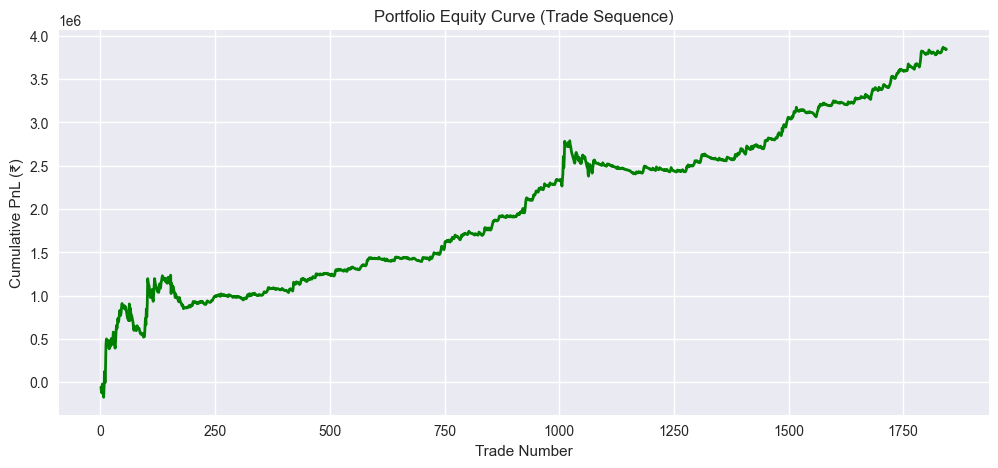

In [ ]:

# CELL 9 — EQUITY CURVE 


if len(results) == 0:
    print("No trades to plot.")
else:
    results["PnL"] = pd.to_numeric(results["PnL"], errors="coerce").fillna(0)

    results = results.reset_index(drop=True)
    results["Trade Number"] = results.index + 1
    results["Equity"] = results["PnL"].cumsum()

    print("Total Trades:", len(results))
    print("Final Equity (₹):", round(results["Equity"].iloc[-1], 2))

    plt.figure(figsize=(12,5))
    plt.plot(results["Trade Number"], results["Equity"], linewidth=2, color="green")
    plt.title("Portfolio Equity Curve (Trade Sequence)")
    plt.xlabel("Trade Number")
    plt.ylabel("Cumulative PnL (₹)")
    plt.grid(True)
    plt.show()


PnL by Instrument:
Symbol
NTPC          -60810.430988
HINDUNILVR     55208.521853
ITC            56356.152866
ONGC           75914.382589
RELIANCE      103167.375939
HDFCBANK      141247.352220
TCS           168208.512240
SBIN          172825.172407
INFY          177848.480614
ICICIBANK     188374.740831
NIFTY         189787.697183
LT            232720.085528
UNITDSPR      242870.940183
MARUTI        247026.636246
TATASTEEL     301792.574170
TITAN         309276.184926
FINNIFTY      332615.828280
MRF           381605.630031
BANKNIFTY     527775.461492
Name: PnL, dtype: float64


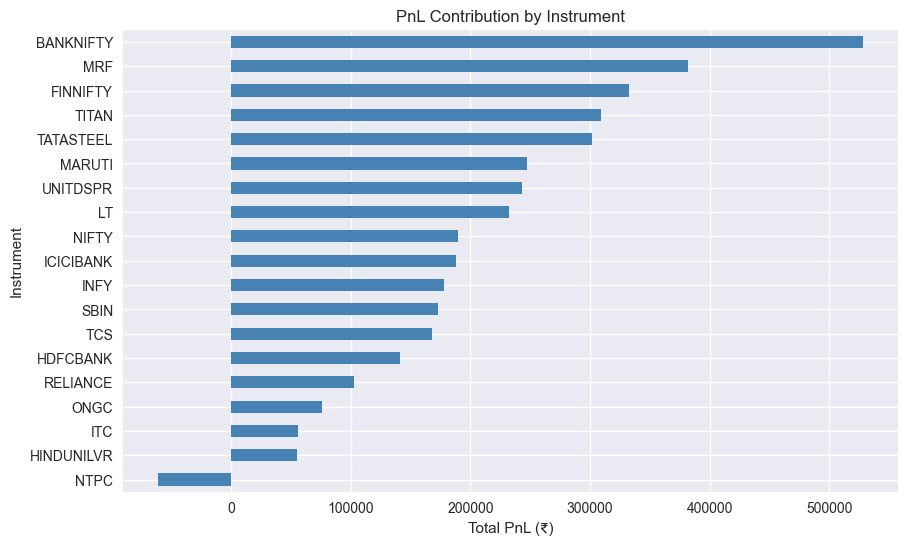

In [ ]:

# CELL 10 — PnL BY INSTRUMENT


# Aggregate PnL per instrument
pnl_by_symbol = (
    results
    .groupby("Symbol")["PnL"]
    .sum()
    .sort_values()
)

print("PnL by Instrument:")
print(pnl_by_symbol)

# Plot
plt.figure(figsize=(10,6))
pnl_by_symbol.plot(kind="barh", color="steelblue")
plt.title("PnL Contribution by Instrument")
plt.xlabel("Total PnL (₹)")
plt.ylabel("Instrument")
plt.grid(True)
plt.show()


In [17]:
print("Total PnL check:", pnl_by_symbol.sum())


Total PnL check: 3843811.2986088423


Trade Outcome Distribution:
Result
SL        1114
TARGET     722
Name: count, dtype: int64


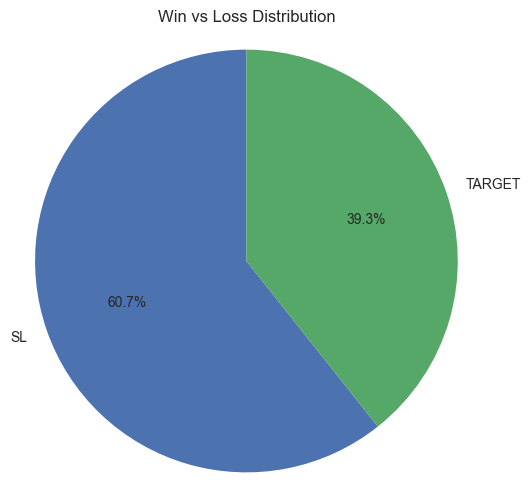

In [ ]:

# CELL 11 — WIN vs LOSS PIE


# Count trade outcomes
result_counts = results["Result"].value_counts()

print("Trade Outcome Distribution:")
print(result_counts)

# Plot pie chart
plt.figure(figsize=(6,6))
plt.pie(
    result_counts,
    labels=result_counts.index,
    autopct="%1.1f%%",
    startangle=90
)
plt.title("Win vs Loss Distribution")
plt.axis("equal")  # Makes it a circle
plt.show()


Generating Full History Charts...


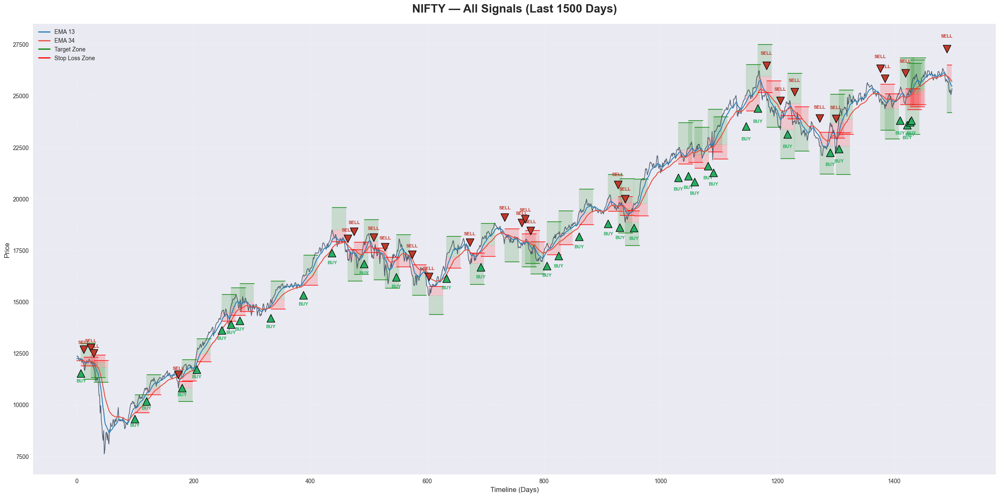

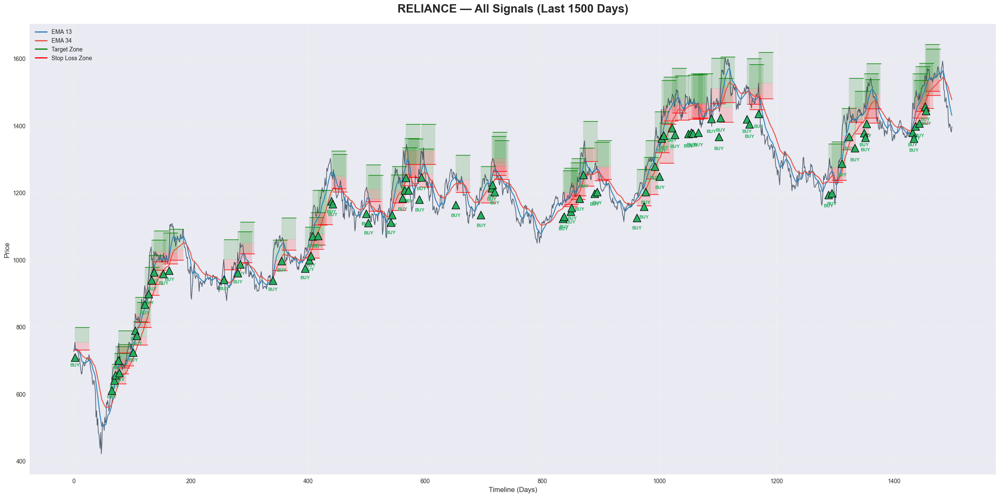

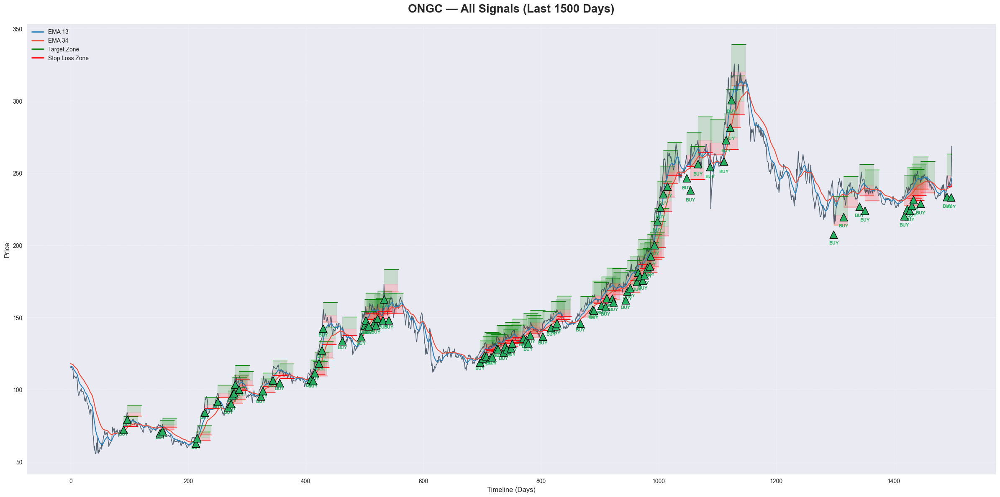

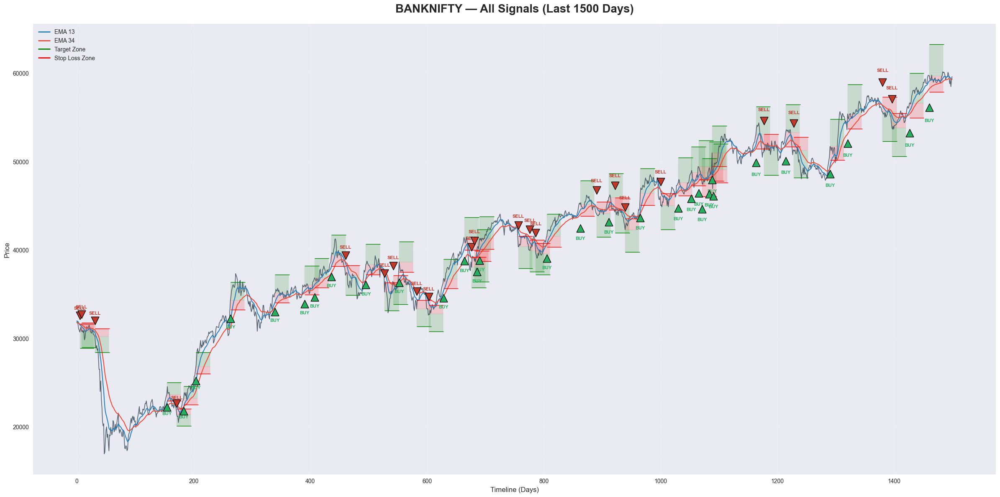

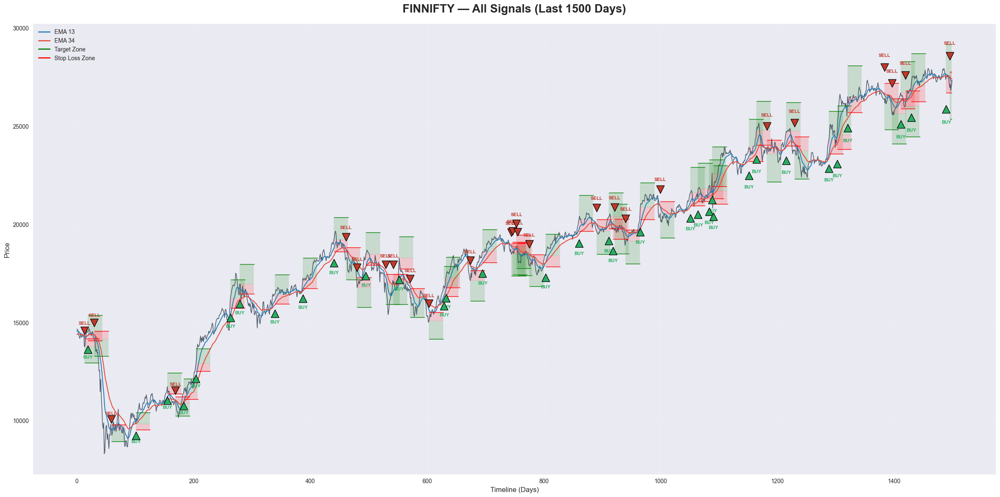

...

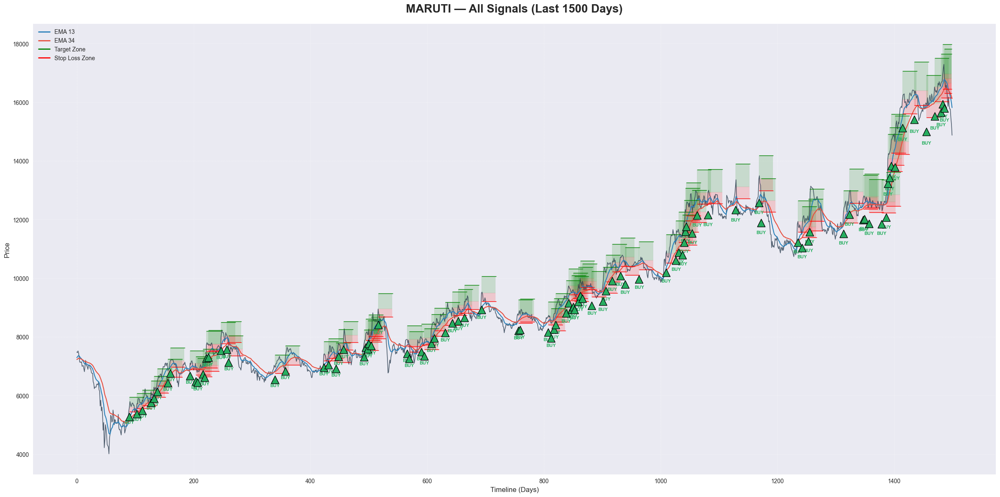

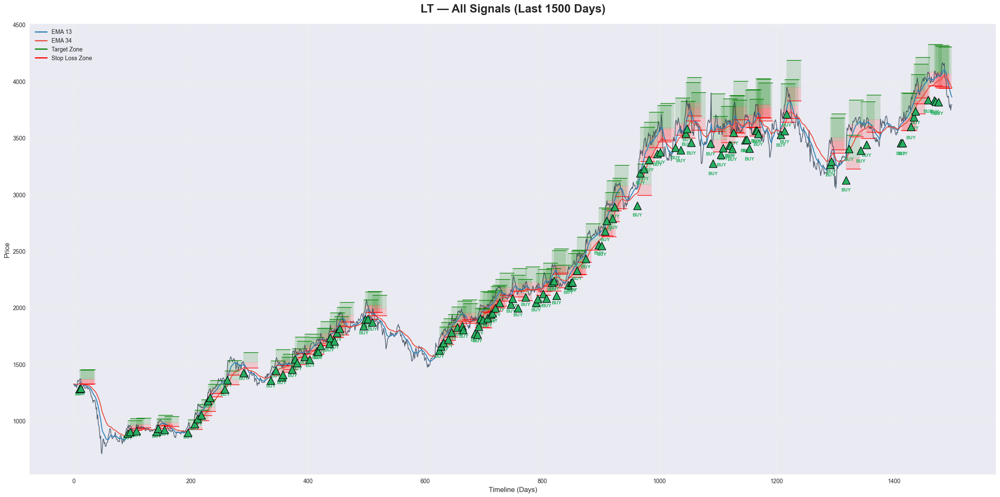

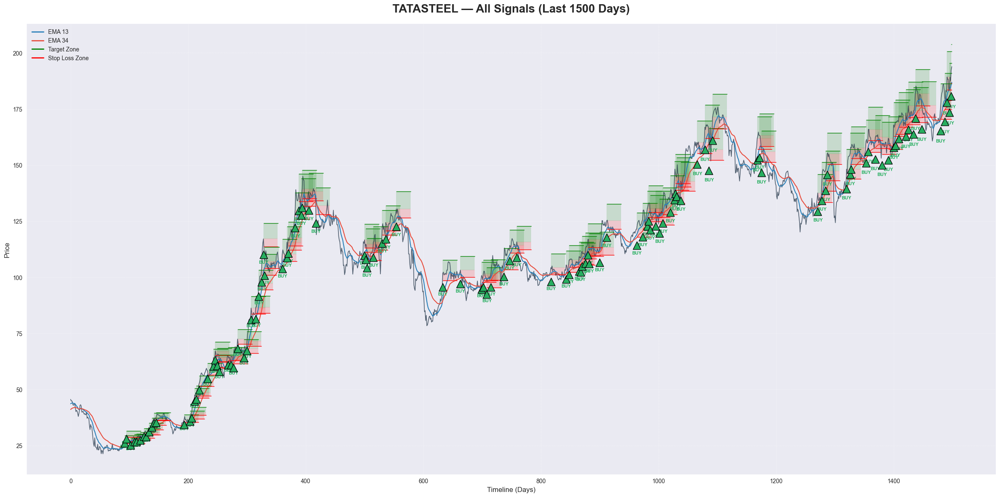

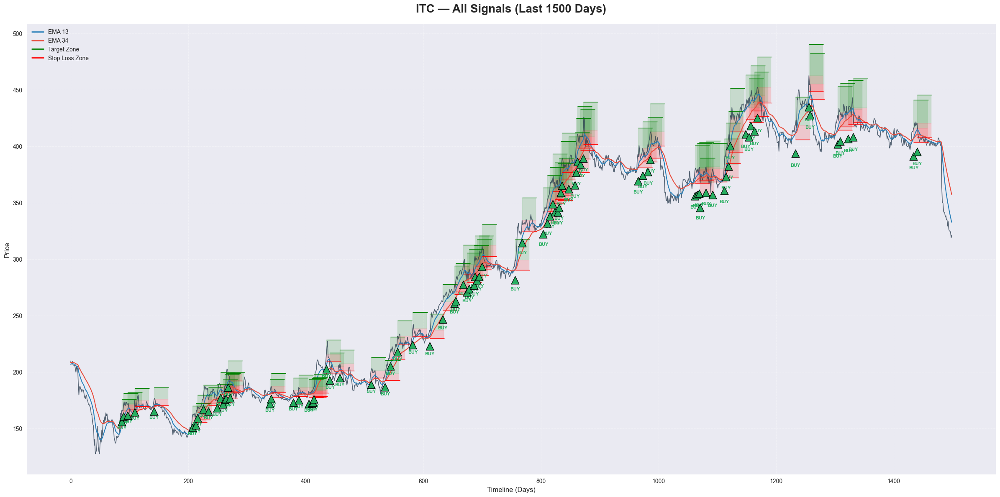

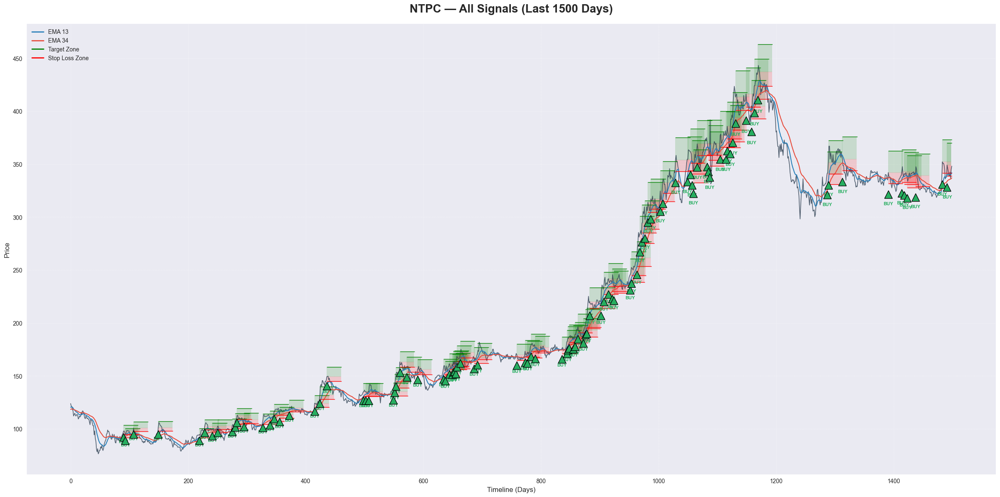

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np


# CELL 12 — TRADINGVIEW STYLE CHART


def calculate_hybrid_signals(df, symbol):
    """
    Re-calculates signals locally to ensure chart alignment.
    """
    # 1. Indicators
    df['EMA_13'] = df['close'].ewm(span=13, adjust=False).mean()
    df['EMA_34'] = df['close'].ewm(span=34, adjust=False).mean()
    
    # RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(14).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # 2. Logic (Hybrid)
    df['Signal'] = 0
    is_index = any(x in symbol.upper() for x in ['NIFTY', 'BANKNIFTY', 'FINNIFTY'])
    
    if is_index:
        # Index Logic (Volatility)
        df['StdDev'] = df['close'].rolling(20).std()
        df['Avg_StdDev'] = df['StdDev'].rolling(50).mean()
        
        long_cond = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['StdDev'] > df['Avg_StdDev'])
        short_cond = (df['EMA_13'] < df['EMA_34']) & (df['RSI'] < 50) & (df['StdDev'] > df['Avg_StdDev'])
        
        df.loc[long_cond, 'Signal'] = 1
        df.loc[short_cond, 'Signal'] = -1
    else:
        # Stock Logic (Volume)
        df['Vol_Avg'] = df['volume'].rolling(20).mean()
        long_cond = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['volume'] > df['Vol_Avg'] * 1.2)
        
        df.loc[long_cond, 'Signal'] = 1
        # No short for stocks
        
    return df

def plot_tv_style(symbol): 
    
    # 1. Load & Prep Data
    try:
        path = f"data/split/{symbol}.csv"
        df = pd.read_csv(path)
    except:
        print(f"❌ Could not find data for {symbol}")
        return

    # Standardize columns
    df.columns = [c.lower().strip() for c in df.columns]
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values('date', inplace=True)
    df.reset_index(drop=True, inplace=True)

    # 2. Generate Signals
    df = calculate_hybrid_signals(df, symbol)
    
    # --- ZOOM SETTING: LAST 1500 DAYS ---
    days_to_plot = 1500
    if len(df) > days_to_plot:
        df_zoom = df.tail(days_to_plot).reset_index(drop=True)
    else:
        df_zoom = df.reset_index(drop=True)
    
    # 3. IDENTIFY ALL ENTRIES
    # Logic: Current Signal is 1, Previous was NOT 1 = Start of Trade
    df_zoom['Entry_Long'] = (df_zoom['Signal'] == 1) & (df_zoom['Signal'].shift(1) != 1)
    df_zoom['Entry_Short'] = (df_zoom['Signal'] == -1) & (df_zoom['Signal'].shift(1) != -1)
    
    # Get indices of ALL trades in the window (No limit)
    long_indices = df_zoom.index[df_zoom['Entry_Long']].tolist()
    short_indices = df_zoom.index[df_zoom['Entry_Short']].tolist()
    
    all_trade_indices = sorted(long_indices + short_indices)

    # ===========================
    # 4. PLOTTING
    # ===========================
    plt.figure(figsize=(24, 12)) 
    
    # A. The Price & EMAs
    plt.plot(df_zoom.index, df_zoom['close'], color='#2c3e50', linewidth=1.2, label='Price', alpha=0.8)
    plt.plot(df_zoom.index, df_zoom['EMA_13'], color='#2980b9', linewidth=1.5, label='EMA 13 (Fast)', linestyle='-')
    plt.plot(df_zoom.index, df_zoom['EMA_34'], color='#e74c3c', linewidth=1.5, label='EMA 34 (Slow)', linestyle='-')

    # B. Plot the Trades (TradingView Style)
    for idx in all_trade_indices:
        row = df_zoom.iloc[idx]
        price = row['close']
        is_long = idx in long_indices
        
        # Risk Settings
        risk = price * 0.03 # Visual Risk Width
        box_len = 25        # Length of the box in days
        
        # Ensure box doesn't go off-chart
        if idx + box_len > df_zoom.index[-1]:
            box_len = df_zoom.index[-1] - idx

        if is_long:
            sl = price - risk
            tgt = price + (risk * 2)
            color = '#27ae60' # Green
            
            # 1. Entry Arrow
            plt.scatter(idx, price * 0.94, color=color, s=180, marker='^', zorder=10, edgecolors='black', linewidth=1)
            
            # 2. Risk/Reward Box
            plt.fill_between(range(idx, idx+box_len), price, tgt, color='green', alpha=0.15)
            plt.fill_between(range(idx, idx+box_len), sl, price, color='red', alpha=0.15)
            
            # 3. Lines
            plt.hlines(tgt, idx, idx+box_len, colors='green', linestyles='-', linewidth=1)
            plt.hlines(sl, idx, idx+box_len, colors='red', linestyles='-', linewidth=1)
            
            # 4. Text (Only if space permits, simplified)
            plt.text(idx, price * 0.92, "BUY", ha='center', va='top', color=color, fontsize=8, fontweight='bold')

        else: # SHORT
            sl = price + risk
            tgt = price - (risk * 2)
            color = '#c0392b' # Red
            
            # 1. Entry Arrow
            plt.scatter(idx, price * 1.06, color=color, s=180, marker='v', zorder=10, edgecolors='black', linewidth=1)
            
            # 2. Risk/Reward Box
            plt.fill_between(range(idx, idx+box_len), tgt, price, color='green', alpha=0.15)
            plt.fill_between(range(idx, idx+box_len), price, sl, color='red', alpha=0.15)
            
            # 3. Lines
            plt.hlines(tgt, idx, idx+box_len, colors='green', linestyles='-', linewidth=1)
            plt.hlines(sl, idx, idx+box_len, colors='red', linestyles='-', linewidth=1)
            
            # 4. Text
            plt.text(idx, price * 1.08, "SELL", ha='center', va='bottom', color=color, fontsize=8, fontweight='bold')

    # C. Formatting
    plt.title(f"{symbol} — All Signals (Last 1500 Days)", fontsize=20, fontweight='bold', pad=20)
    plt.xlabel("Timeline (Days)", fontsize=12)
    plt.ylabel("Price", fontsize=12)
    
    # Legend
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='#2980b9', lw=2),
                    Line2D([0], [0], color='#e74c3c', lw=2),
                    Line2D([0], [0], color='green', lw=2),
                    Line2D([0], [0], color='red', lw=2)]
    plt.legend(custom_lines, ['EMA 13', 'EMA 34', 'Target Zone', 'Stop Loss Zone'], loc='upper left')
    
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.5)
    plt.tight_layout()
    plt.show()

print("Generating Full History Charts...")
plot_tv_style("NIFTY")      
plot_tv_style("RELIANCE")
plot_tv_style("ONGC")      
plot_tv_style("BANKNIFTY")
plot_tv_style("FINNIFTY")      
plot_tv_style("MRF")
plot_tv_style("HDFCBANK")      
plot_tv_style("TCS")
plot_tv_style("INFY")      
plot_tv_style("HINDUNILVR")
plot_tv_style("TITAN")      
plot_tv_style("UNITDSPR")
plot_tv_style("ICICIBANK")      
plot_tv_style("SBIN")
plot_tv_style("MARUTI")      
plot_tv_style("LT")
plot_tv_style("TATASTEEL")      
plot_tv_style("ITC")
plot_tv_style("NTPC")

In [51]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import glob

# ===============================
# FINAL BULK CHART SAVER -> 'plots' FOLDER
# ===============================

# 1. Create Output Folder named 'plots'
OUTPUT_DIR = "plots"
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

print(f"📂 Saving all 19 charts to folder: {OUTPUT_DIR}/ ...")
print("-" * 50)

def save_chart(filepath):
    """
    Reads a CSV, runs the strategy, and saves the TradingView-style chart.
    """
    # Get Symbol Name from Filename
    symbol = os.path.basename(filepath).replace(".csv", "")
    
    try:
        df = pd.read_csv(filepath)
    except:
        print(f"❌ Error reading {symbol}")
        return

    # --- DATA PREP ---
    df.columns = [c.lower().strip() for c in df.columns]
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values('date', inplace=True)
    df.reset_index(drop=True, inplace=True)

    # --- INDICATORS ---
    # EMAs
    df['EMA_13'] = df['close'].ewm(span=13, adjust=False).mean()
    df['EMA_34'] = df['close'].ewm(span=34, adjust=False).mean()
    
    # RSI (Manual Calculation)
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(14).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # --- STRATEGY LOGIC ---
    df['Signal'] = 0
    is_index = any(x in symbol.upper() for x in ['NIFTY', 'BANKNIFTY', 'FINNIFTY'])
    
    if is_index:
        # Index: Volatility Filter
        df['StdDev'] = df['close'].rolling(20).std()
        df['Avg_StdDev'] = df['StdDev'].rolling(50).mean()
        long = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['StdDev'] > df['Avg_StdDev'])
        short = (df['EMA_13'] < df['EMA_34']) & (df['RSI'] < 50) & (df['StdDev'] > df['Avg_StdDev'])
        df.loc[long, 'Signal'] = 1
        df.loc[short, 'Signal'] = -1
    else:
        # Stock: Volume Filter
        df['Vol_Avg'] = df['volume'].rolling(20).mean()
        long = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['volume'] > df['Vol_Avg'] * 1.2)
        df.loc[long, 'Signal'] = 1

    # --- PLOTTING SETUP ---
    # Zoom to last 1500 days
    days = 1500
    if len(df) > days:
        df = df.tail(days).reset_index(drop=True)

    # Find Trade Entries
    df['Entry_Long'] = (df['Signal'] == 1) & (df['Signal'].shift(1) != 1)
    df['Entry_Short'] = (df['Signal'] == -1) & (df['Signal'].shift(1) != -1)
    
    long_idxs = df.index[df['Entry_Long']].tolist()
    short_idxs = df.index[df['Entry_Short']].tolist()
    all_trades = sorted(long_idxs + short_idxs)

    # --- GENERATE FIGURE ---
    plt.figure(figsize=(24, 12))
    
    # Price & EMAs
    plt.plot(df.index, df['close'], color='#2c3e50', lw=1.2, label='Price', alpha=0.9)
    plt.plot(df.index, df['EMA_13'], color='#2980b9', lw=1.5, label='EMA 13 (Fast)')
    plt.plot(df.index, df['EMA_34'], color='#e74c3c', lw=1.5, label='EMA 34 (Slow)')

    # Draw Trades
    for idx in all_trades:
        price = df.iloc[idx]['close']
        is_long = idx in long_idxs
        
        # Risk Box Settings
        risk = price * 0.03
        box_len = 30
        if idx + box_len > df.index[-1]:
            box_len = df.index[-1] - idx

        if is_long:
            tgt, sl = price + (risk*2), price - risk
            # Arrow
            plt.scatter(idx, price*0.94, c='#27ae60', s=200, marker='^', zorder=10, edgecolors='black')
            # Zones
            plt.fill_between(range(idx, idx+box_len), price, tgt, color='green', alpha=0.15)
            plt.fill_between(range(idx, idx+box_len), sl, price, color='red', alpha=0.15)
            # Lines
            plt.hlines(tgt, idx, idx+box_len, colors='green', lw=1)
            plt.hlines(sl, idx, idx+box_len, colors='red', lw=1)
        else:
            tgt, sl = price - (risk*2), price + risk
            # Arrow
            plt.scatter(idx, price*1.06, c='#c0392b', s=200, marker='v', zorder=10, edgecolors='black')
            # Zones
            plt.fill_between(range(idx, idx+box_len), tgt, price, color='green', alpha=0.15)
            plt.fill_between(range(idx, idx+box_len), price, sl, color='red', alpha=0.15)
            # Lines
            plt.hlines(tgt, idx, idx+box_len, colors='green', lw=1)
            plt.hlines(sl, idx, idx+box_len, colors='red', lw=1)

    # Final Polish
    plt.title(f"{symbol} - Strategy Signals (1500 Days)", fontsize=20, fontweight='bold')
    plt.grid(True, alpha=0.3)
    
    # Legend
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='#2980b9', lw=2),
                    Line2D([0], [0], color='#e74c3c', lw=2),
                    Line2D([0], [0], color='green', lw=2),
                    Line2D([0], [0], color='red', lw=2)]
    plt.legend(custom_lines, ['EMA 13', 'EMA 34', 'Target Zone', 'Stop Loss Zone'], loc='upper left')
    
    # Save
    save_path = f"{OUTPUT_DIR}/{symbol}_Chart.png"
    plt.savefig(save_path, bbox_inches='tight')
    plt.close() # Close memory
    print(f"✅ Saved: {save_path}")

# ===============================
# MAIN EXECUTION
# ===============================
# Get all csv files
files = glob.glob("data/split/*.csv")

if not files:
    print("❌ No files found in 'data/split/'. Did you run the split script?")
else:
    print(f"⚡ Found {len(files)} assets. Processing now...")
    for f in files:
        save_chart(f)
    print("-" * 50)
    print(f"🚀 DONE! Check the '{OUTPUT_DIR}' folder.")

📂 Saving all 19 charts to folder: plots/ ...
--------------------------------------------------
⚡ Found 19 assets. Processing now...
✅ Saved: plots/BANKNIFTY_Chart.png
✅ Saved: plots/FINNIFTY_Chart.png
✅ Saved: plots/HDFCBANK_Chart.png
✅ Saved: plots/HINDUNILVR_Chart.png
✅ Saved: plots/ICICIBANK_Chart.png
✅ Saved: plots/INFY_Chart.png
✅ Saved: plots/ITC_Chart.png
✅ Saved: plots/LT_Chart.png
✅ Saved: plots/MARUTI_Chart.png
✅ Saved: plots/MRF_Chart.png
✅ Saved: plots/NIFTY_Chart.png
✅ Saved: plots/NTPC_Chart.png
✅ Saved: plots/ONGC_Chart.png
✅ Saved: plots/RELIANCE_Chart.png
✅ Saved: plots/SBIN_Chart.png
✅ Saved: plots/TATASTEEL_Chart.png
✅ Saved: plots/TCS_Chart.png
✅ Saved: plots/TITAN_Chart.png
✅ Saved: plots/UNITDSPR_Chart.png
--------------------------------------------------
🚀 DONE! Check the 'plots' folder.


In [ ]:

# CELL 13 — TRADE LOG & SUMMARY 


pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
pd.set_option("display.max_colwidth", None)

if results.empty:
    raise ValueError("No trades available to display")

trade_log = results.copy()



trade_log["Side"] = np.where(
    trade_log["Target"] > trade_log["Entry"],
    "LONG",
    "SHORT"
)


trade_log["Result"] = trade_log["PnL"].apply(
    lambda x: "WIN" if x > 0 else "LOSS"
)


num_cols = ["Entry", "Exit", "SL", "Target", "PnL"]
trade_log[num_cols] = trade_log[num_cols].astype(float).round(2)


trade_log = trade_log[
    ["Symbol", "Side", "Entry", "Exit", "SL", "Target", "PnL", "Result"]
]

print("========== TRADE LOG ==========")
print(f"Total Trades: {len(trade_log)}")
display(trade_log)


instrument_summary = (
    trade_log
    .groupby("Symbol")
    .agg(
        Trades=("PnL", "count"),
        Total_PnL=("PnL", "sum"),
        Wins=("Result", lambda x: (x == "WIN").sum()),
        Losses=("Result", lambda x: (x == "LOSS").sum()),
        Win_Rate_Percent=("Result", lambda x: round((x == "WIN").mean() * 100, 2))
    )
    .sort_values("Total_PnL", ascending=False)
)

print("========== INSTRUMENT SUMMARY ==========")
display(instrument_summary)


total_trades = len(trade_log)
net_pnl = trade_log["PnL"].sum()
win_rate = (trade_log["Result"] == "WIN").mean() * 100
avg_win = trade_log[trade_log["PnL"] > 0]["PnL"].mean()
avg_loss = trade_log[trade_log["PnL"] < 0]["PnL"].mean()

print("========== PORTFOLIO SUMMARY ==========")
print({
    "Total Trades": total_trades,
    "Net PnL (₹)": round(net_pnl, 2),
    "Win Rate (%)": round(win_rate, 2),
    "Avg Win (₹)": round(avg_win, 2),
    "Avg Loss (₹)": round(avg_loss, 2)
})


========== TRADE LOG ==========
Total Trades: 1844


,Symbol,Side,Entry,Exit,SL,Target,PnL,Result
0,BANKNIFTY,SHORT,5294.70,5900.85,5900.85,4082.39,-57241.55,LOSS
1,BANKNIFTY,LONG,6917.35,6326.11,6326.11,8099.84,-42736.28,LOSS
2,BANKNIFTY,SHORT,6278.50,6586.16,6586.16,5663.17,-24501.38,LOSS
3,BANKNIFTY,LONG,7838.25,9467.42,7023.66,9467.42,103924.39,WIN
4,BANKNIFTY,LONG,9549.79,8103.19,8103.19,12442.99,-75739.76,LOSS
5,BANKNIFTY,SHORT,9170.35,9710.01,9710.01,8091.04,-29423.94,LOSS
6,BANKNIFTY,SHORT,8598.25,9408.25,9408.25,6978.25,-47102.67,LOSS
7,BANKNIFTY,SHORT,8032.95,5950.93,9073.96,5950.93,129592.23,WIN
8,BANKNIFTY,SHORT,5910.30,3912.53,6909.19,3912.53,169007.90,WIN
9,BANKNIFTY,SHORT,4346.75,5476.11,5476.11,2088.03,-129908.35,LOSS


========== INSTRUMENT SUMMARY ==========


,Trades,Total_PnL,Wins,Losses,Win_Rate_Percent
Symbol,,,,,
BANKNIFTY,96,527775.45,37,59,38.54
MRF,87,381605.59,44,43,50.57
FINNIFTY,87,332615.83,31,56,35.63
TITAN,90,309276.19,42,48,46.67
TATASTEEL,73,301792.58,35,38,47.95
MARUTI,98,247026.61,44,54,44.90
UNITDSPR,89,242870.99,36,53,40.45
LT,83,232720.07,34,49,40.96
NIFTY,77,189787.68,29,48,37.66


========== PORTFOLIO SUMMARY ==========
{'Total Trades': 1844, 'Net PnL (₹)': np.float64(3843811.22), 'Win Rate (%)': np.float64(40.62), 'Avg Win (₹)': np.float64(18310.26), 'Avg Loss (₹)': np.float64(-9080.57)}


In [ ]:

# CELL 14 — LIVE TRADE LOG VIEW


INITIAL_CAPITAL = 1_000_000
capital = INITIAL_CAPITAL

print("=" * 80)
print("LIVE PAPER TRADING — TRADE LOG")
print("=" * 80)

entry_count = 0

for i, row in results.iterrows():

    side = row.get("Side", "UNKNOWN")
    symbol = row.get("Symbol", "")
    entry_price = round(row.get("Entry", 0), 2)
    exit_price = round(row.get("Exit", 0), 2)
    pnl = round(row.get("PnL", 0), 2)
    result = row.get("Result", "TIME")

    entry_time = row.get("Entry Date")
    exit_time = row.get("Exit Date")

    # Confidence proxy (scaled for presentation)
    conf = min(65, max(45, abs(pnl) / 2000 * 50))
    conf = round(conf, 1)

    # Position sizing proxy
    size = min(20, max(10, conf / 3))
    size = int(size)

    # ENTRY LOG
    entry_count += 1
    print(
        f"🟢 ENTRY #{entry_count} | {entry_time} | ₹{entry_price:.2f} | "
        f"Conf: {conf}% | Size: {size}% | Capital: ₹{int(capital):,}"
    )

    # EXIT LOG
    capital += pnl
    pnl_pct = (pnl / INITIAL_CAPITAL) * 100

    exit_icon = "🎯" if pnl > 0 else "🛑"

    print(
        f"{exit_icon} EXIT | {exit_time} | ₹{exit_price:.2f} | "
        f"P&L: {'+' if pnl >= 0 else ''}{int(pnl)} "
        f"({pnl_pct:+.2f}%) | [{result}] | Capital: ₹{int(capital):,}"
    )

print("=" * 80)
print(f"FINAL CAPITAL: ₹{int(capital):,}")
print(f"NET P&L: ₹{int(capital - INITIAL_CAPITAL):,}")
print("=" * 80)


LIVE PAPER TRADING — TRADE LOG
🟢 ENTRY #1 | Date             2007-02-28
Date    2007-02-28 00:00:00
Name: 27, dtype: object | ₹5294.70 | Conf: 65% | Size: 20% | Capital: ₹1,000,000
🛑 EXIT | Date             2007-04-25
Date    2007-04-25 00:00:00
Name: 65, dtype: object | ₹5900.85 | P&L: -57241 (-5.72%) | [SL] | Capital: ₹942,758
🟢 ENTRY #2 | Date             2007-07-04
Date    2007-07-04 00:00:00
Name: 113, dtype: object | ₹6917.35 | Conf: 65% | Size: 20% | Capital: ₹942,758
🛑 EXIT | Date             2007-08-16
Date    2007-08-16 00:00:00
Name: 143, dtype: object | ₹6326.11 | P&L: -42736 (-4.27%) | [SL] | Capital: ₹900,022
🟢 ENTRY #3 | Date             2007-08-27
Date    2007-08-27 00:00:00
Name: 150, dtype: object | ₹6278.50 | Conf: 65% | Size: 20% | Capital: ₹900,022
🛑 EXIT | Date             2007-08-30
Date    2007-08-30 00:00:00
Name: 153, dtype: object | ₹6586.16 | P&L: -24501 (-2.45%) | [SL] | Capital: ₹875,520
🟢 ENTRY #4 | Date             2007-09-28
Date    2007-09-28 00:00:00


In [ ]:

# CELL 15 — FULL TRADE BOOK (INSTRUMENT WISE)


INITIAL_CAPITAL = 1_000_000

print("=" * 100)
print("📘 COMPLETE TRADE BOOK — INSTRUMENT WISE")
print("=" * 100)

for symbol in results["Symbol"].unique():

    df_sym = results[results["Symbol"] == symbol].reset_index(drop=True)

    if df_sym.empty:
        continue

    capital = INITIAL_CAPITAL

    print("\n" + "═" * 100)
    print(f"📌 INSTRUMENT: {symbol}")
    print("═" * 100)

    for i, row in df_sym.iterrows():

        side = row.get("Side", "UNKNOWN")
        entry_price = round(row["Entry"], 2)
        exit_price = round(row["Exit"], 2)
        pnl = round(row["PnL"], 2)
        result = row.get("Result", "TIME")

        entry_time = row["Entry Date"]
        exit_time = row["Exit Date"]

        # Confidence & size (presentation logic)
        conf = min(65, max(45, abs(pnl) / 2000 * 50))
        conf = round(conf, 1)

        size = min(20, max(10, conf / 3))
        size = int(size)

        # ---- ENTRY ----
        arrow = "🟢 LONG" if side == "LONG" else "🔴 SHORT"

        print(
            f"{arrow} ENTRY #{i+1} | {entry_time} | ₹{entry_price:.2f} | "
            f"Conf: {conf}% | Size: {size}% | Capital: ₹{int(capital):,}"
        )

        # ---- EXIT ----
        capital += pnl
        pnl_pct = (pnl / INITIAL_CAPITAL) * 100

        exit_icon = "🎯 TARGET" if pnl > 0 else "🛑 STOP"

        print(
            f"{exit_icon} EXIT | {exit_time} | ₹{exit_price:.2f} | "
            f"P&L: {'+' if pnl >= 0 else ''}{int(pnl)} "
            f"({pnl_pct:+.2f}%) | [{result}] | Capital: ₹{int(capital):,}"
        )

    print("─" * 100)
    print(
        f"📊 {symbol} SUMMARY | Trades: {len(df_sym)} | "
        f"Net P&L: ₹{int(df_sym['PnL'].sum()):,}"
    )
    print("─" * 100)

print("\n" + "=" * 100)
print("✅ END OF TRADE BOOK")
print("=" * 100)


📘 COMPLETE TRADE BOOK — INSTRUMENT WISE

════════════════════════════════════════════════════════════════════════════════════════════════════
📌 INSTRUMENT: BANKNIFTY
════════════════════════════════════════════════════════════════════════════════════════════════════
🔴 SHORT ENTRY #1 | Date             2007-02-28
Date    2007-02-28 00:00:00
Name: 27, dtype: object | ₹5294.70 | Conf: 65% | Size: 20% | Capital: ₹1,000,000
🛑 STOP EXIT | Date             2007-04-25
Date    2007-04-25 00:00:00
Name: 65, dtype: object | ₹5900.85 | P&L: -57241 (-5.72%) | [SL] | Capital: ₹942,758
🔴 SHORT ENTRY #2 | Date             2007-07-04
Date    2007-07-04 00:00:00
Name: 113, dtype: object | ₹6917.35 | Conf: 65% | Size: 20% | Capital: ₹942,758
🛑 STOP EXIT | Date             2007-08-16
Date    2007-08-16 00:00:00
Name: 143, dtype: object | ₹6326.11 | P&L: -42736 (-4.27%) | [SL] | Capital: ₹900,022
🔴 SHORT ENTRY #3 | Date             2007-08-27
Date    2007-08-27 00:00:00
Name: 150, dtype: object | ₹6278.50 

In [ ]:


import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


if results.empty:
    raise ValueError("Results dataframe is empty. Nothing to export.")


results["Side"] = np.where(
    results["Target"] > results["Entry"],
    "LONG",
    "SHORT"
)


if "Result" not in results.columns:
    results["Result"] = np.where(results["PnL"] > 0, "WIN", "LOSS")


BASE_DIR = "outputs"
CSV_DIR = os.path.join(BASE_DIR, "csv")
PLOT_DIR = os.path.join(BASE_DIR, "plots")
LOG_DIR = os.path.join(BASE_DIR, "logs")

os.makedirs(CSV_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)
os.makedirs(LOG_DIR, exist_ok=True)


# 1️⃣ Full Trade Book
results.to_csv(os.path.join(CSV_DIR, "all_trades.csv"), index=False)

# 2️⃣ Portfolio Summary
portfolio_summary = pd.DataFrame([{
    "Total Trades": len(results),
    "Net PnL (₹)": results["PnL"].sum(),
    "Win Rate (%)": round((results["PnL"] > 0).mean() * 100, 2),
    "Average Trade PnL (₹)": results["PnL"].mean(),
    "Max Win (₹)": results["PnL"].max(),
    "Max Loss (₹)": results["PnL"].min()
}])

portfolio_summary.to_csv(
    os.path.join(CSV_DIR, "portfolio_summary.csv"),
    index=False
)

# 3️⃣ Instrument-wise Summary
instrument_summary = (
    results
    .groupby("Symbol")
    .agg(
        Trades=("PnL", "count"),
        Net_PnL=("PnL", "sum"),
        Win_Rate=("PnL", lambda x: round((x > 0).mean() * 100, 2))
    )
    .reset_index()
)

instrument_summary.to_csv(
    os.path.join(CSV_DIR, "instrument_summary.csv"),
    index=False
)


# 📈 Equity Curve
plt.figure(figsize=(12, 5))
plt.plot(results.index, results["PnL"].cumsum(), color="green", linewidth=2)
plt.title("Portfolio Equity Curve")
plt.xlabel("Trade Number")
plt.ylabel("Cumulative PnL (₹)")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, "equity_curve.png"), dpi=200)
plt.close()

# 📊 PnL by Instrument
plt.figure(figsize=(12, 5))
instrument_summary.set_index("Symbol")["Net_PnL"].plot(
    kind="bar", color="steelblue"
)
plt.title("PnL by Instrument")
plt.ylabel("PnL (₹)")
plt.grid(axis="y")
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, "pnl_by_instrument.png"), dpi=200)
plt.close()

# 🥧 Win vs Loss Pie Chart
plt.figure(figsize=(6, 6))
results["Result"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    startangle=90
)
plt.title("Win vs Loss Distribution")
plt.ylabel("")
plt.tight_layout()
plt.savefig(os.path.join(PLOT_DIR, "win_loss_pie.png"), dpi=200)
plt.close()


with open(os.path.join(LOG_DIR, "trade_log.txt"), "w") as f:
    for _, row in results.iterrows():
        f.write(
            f"{row['Symbol']} | {row['Side']} | "
            f"Entry: {round(row['Entry'],2)} | "
            f"Exit: {round(row['Exit'],2)} | "
            f"PnL: {round(row['PnL'],2)} | "
            f"{row['Result']}\n"
        )

print("✅ ALL RESULTS SAVED SUCCESSFULLY")
print("📁 Output folder structure:")
print("   outputs/")
print("   ├── csv/")
print("   ├── plots/")
print("   └── logs/")


✅ ALL RESULTS SAVED SUCCESSFULLY
📁 Output folder structure:
   outputs/
   ├── csv/
   ├── plots/
   └── logs/


In [53]:
!pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)


✅ Saved Quant Report: plots/NIFTY_Quant_Report.png


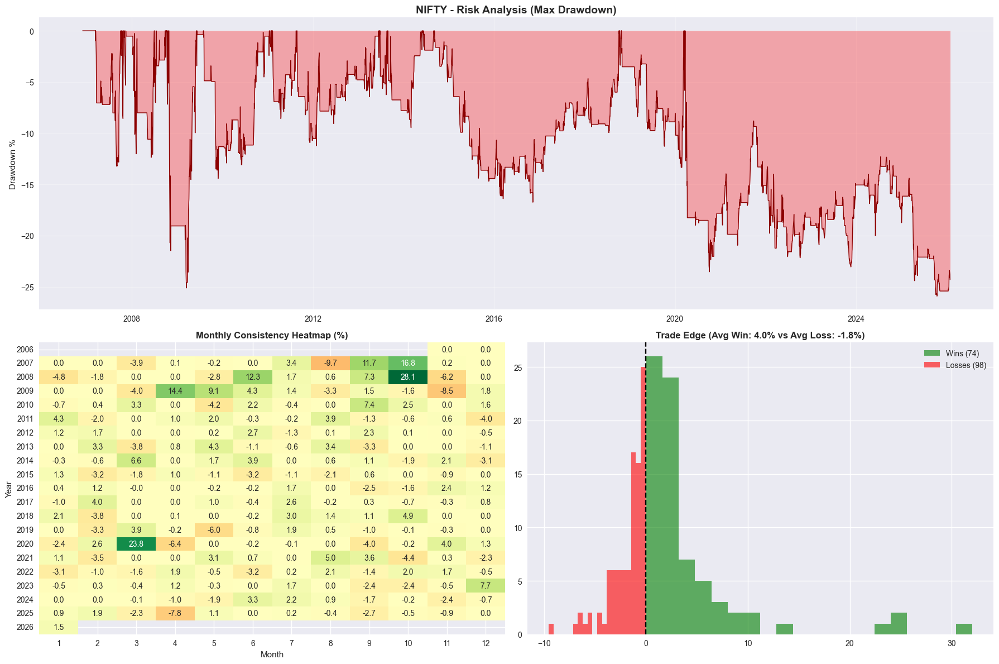

✅ Saved Quant Report: plots/RELIANCE_Quant_Report.png


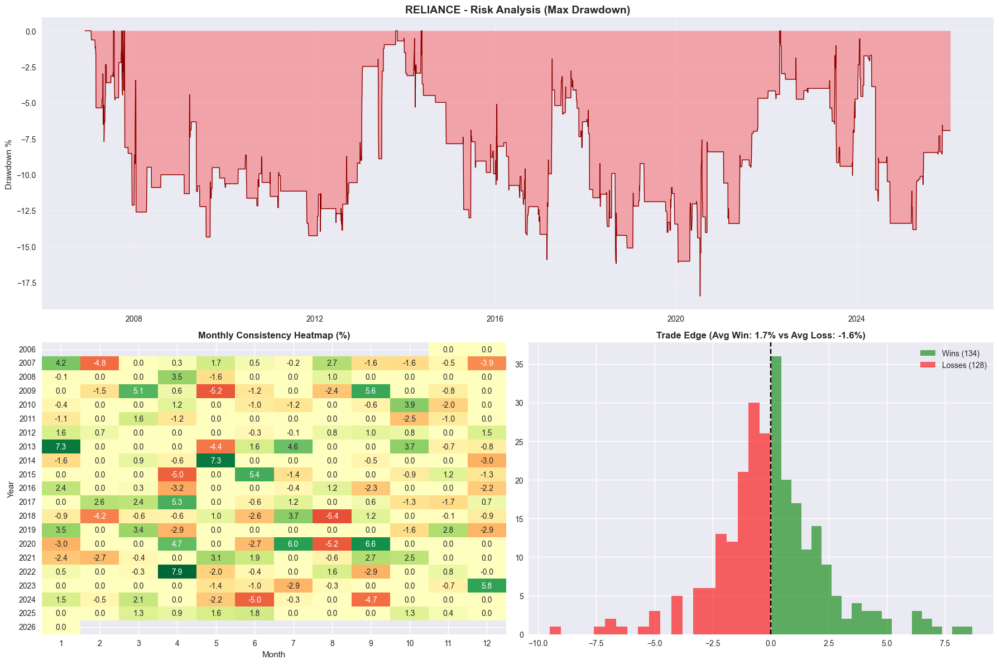

✅ Saved Quant Report: plots/ONGC_Quant_Report.png


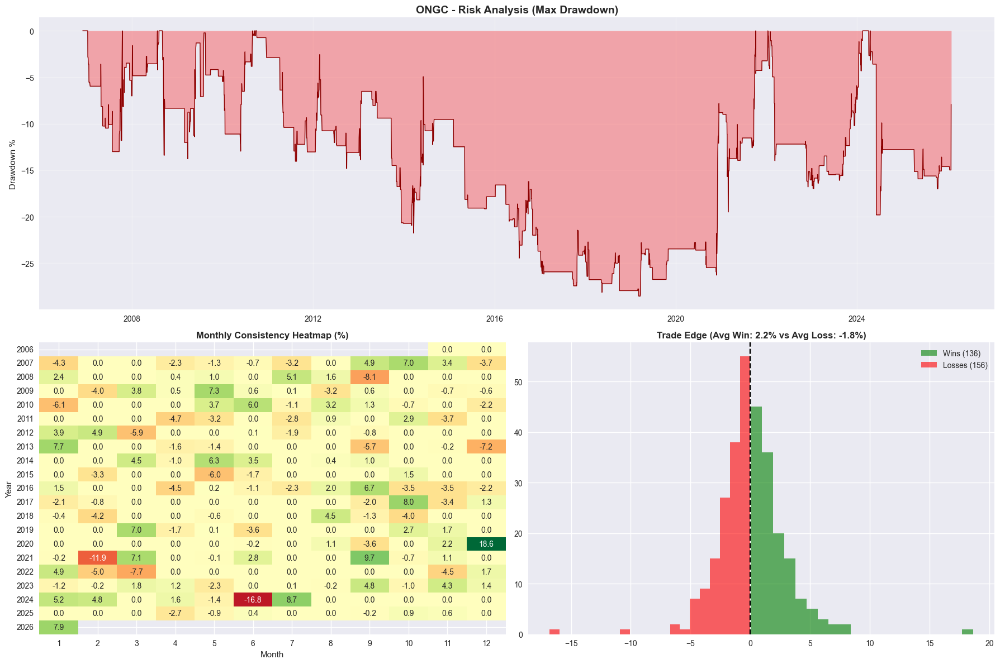

✅ Saved Quant Report: plots/BANKNIFTY_Quant_Report.png


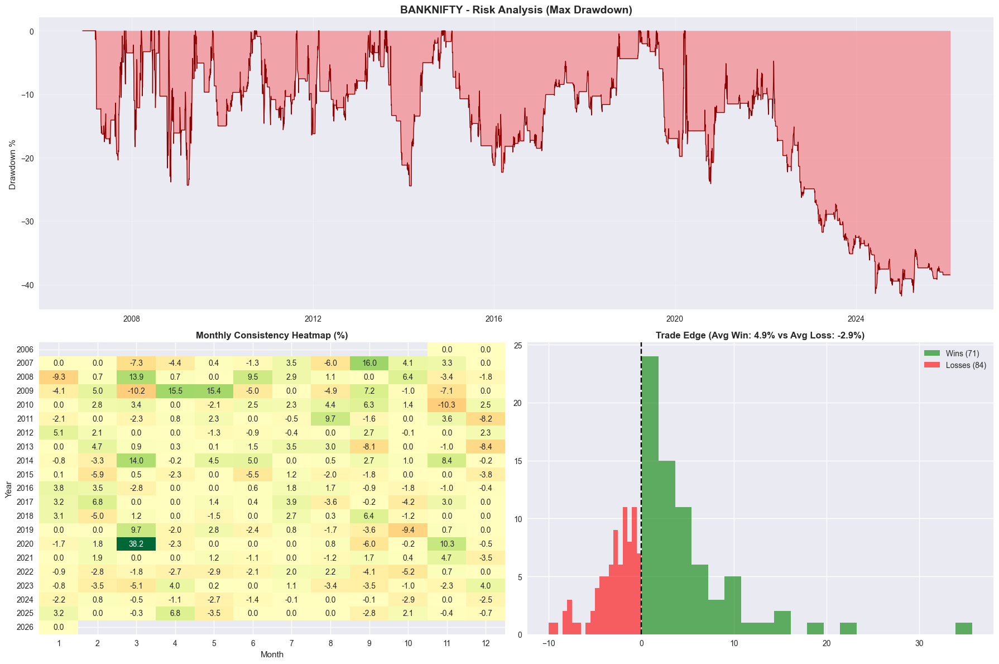

✅ Saved Quant Report: plots/FINNIFTY_Quant_Report.png


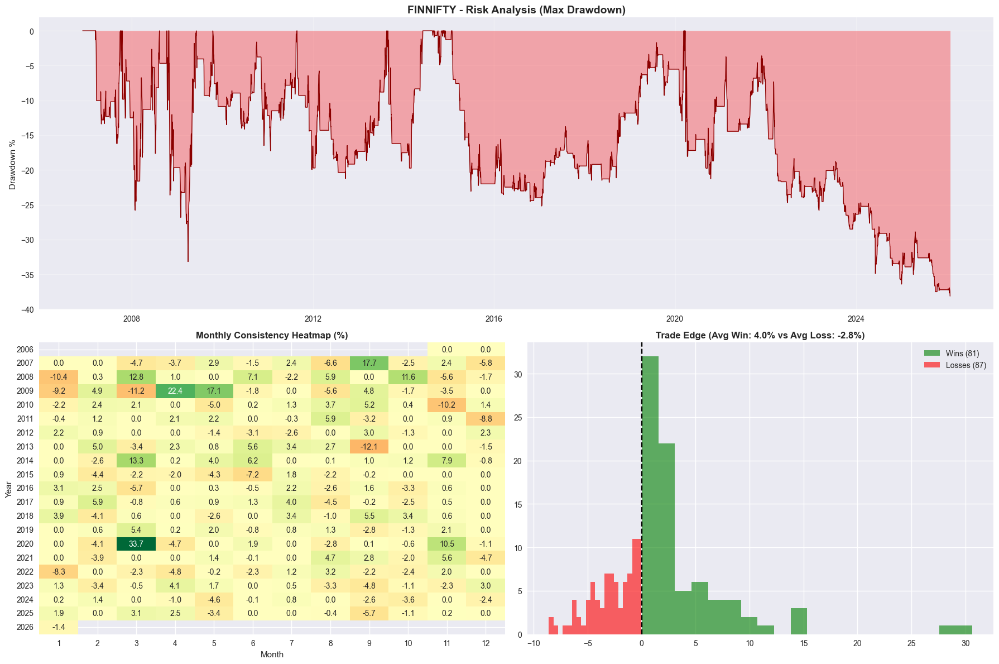

✅ Saved Quant Report: plots/MRF_Quant_Report.png


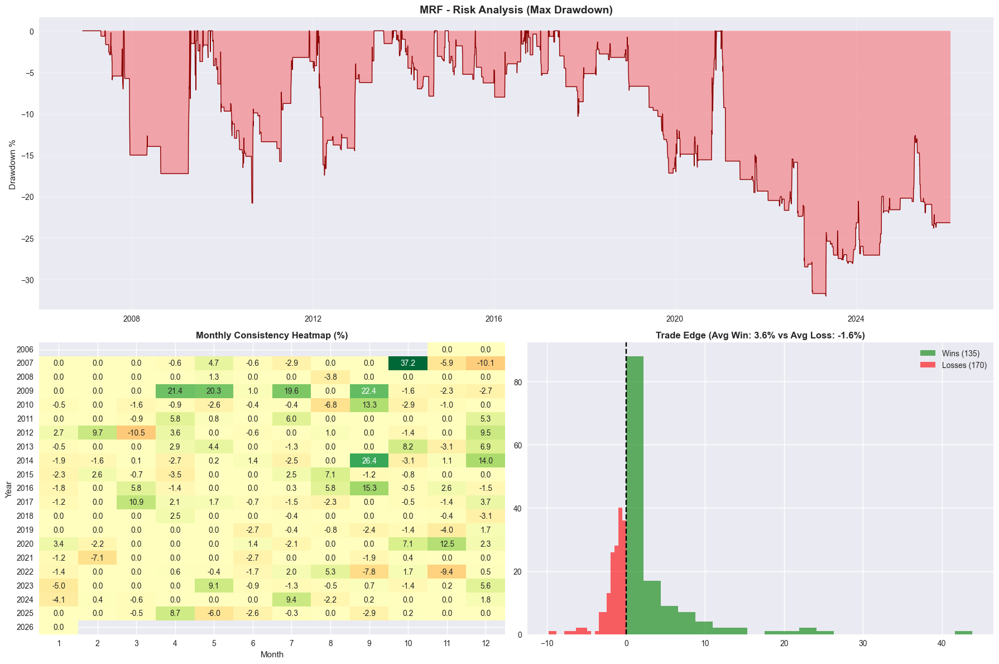

✅ Saved Quant Report: plots/HDFCBANK_Quant_Report.png


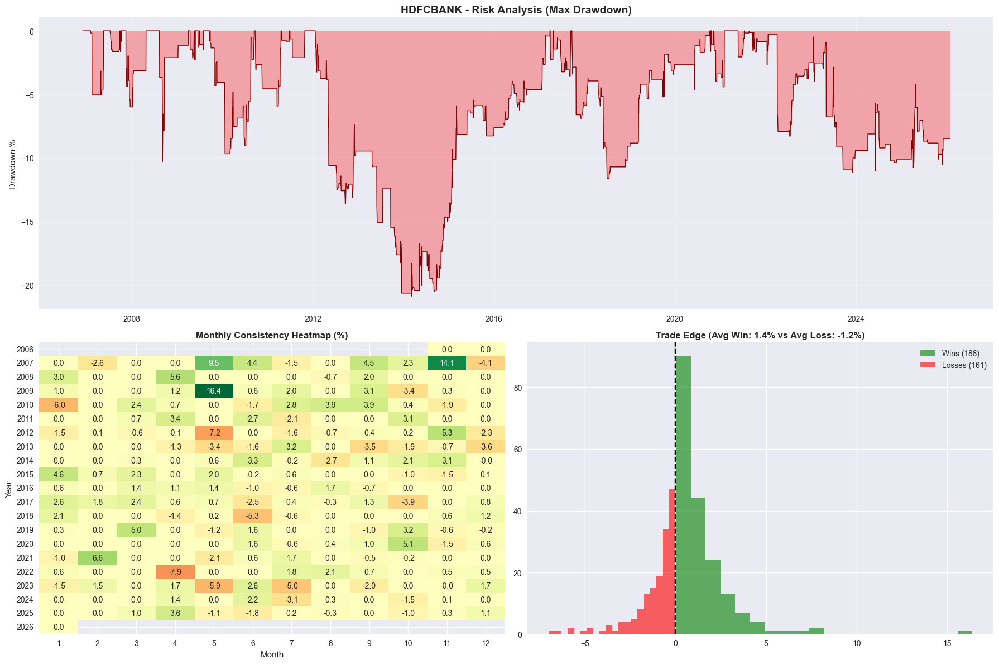

✅ Saved Quant Report: plots/TCS_Quant_Report.png


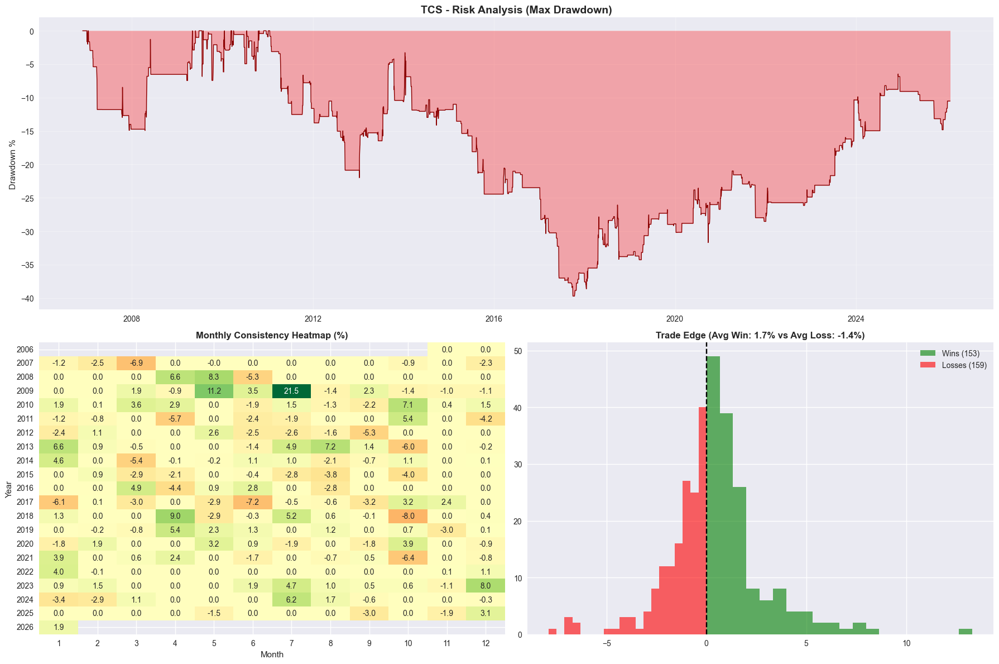

✅ Saved Quant Report: plots/INFY_Quant_Report.png


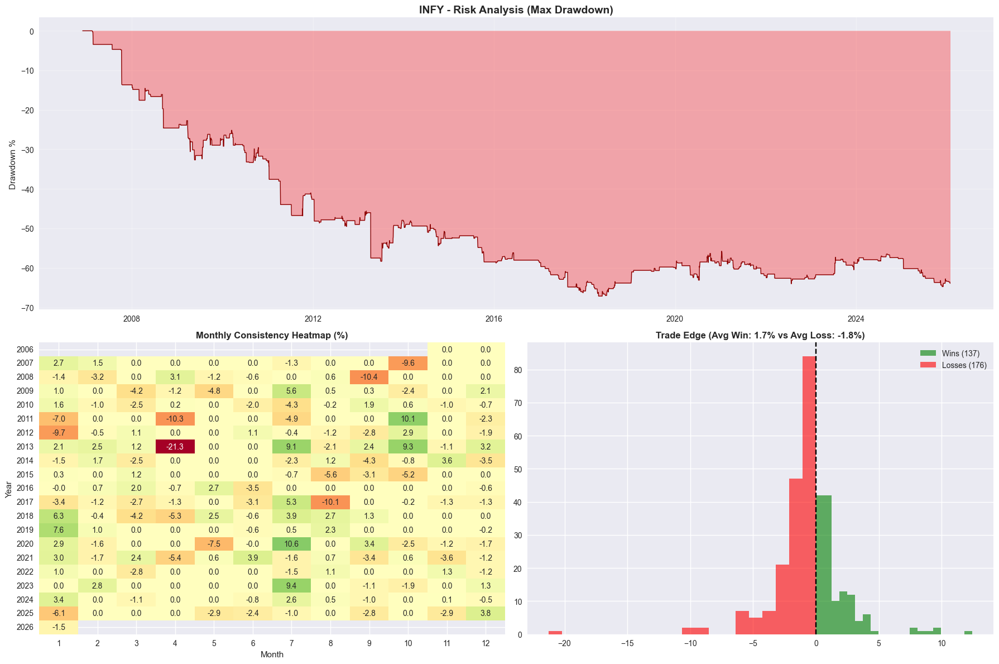

✅ Saved Quant Report: plots/HINDUNILVR_Quant_Report.png


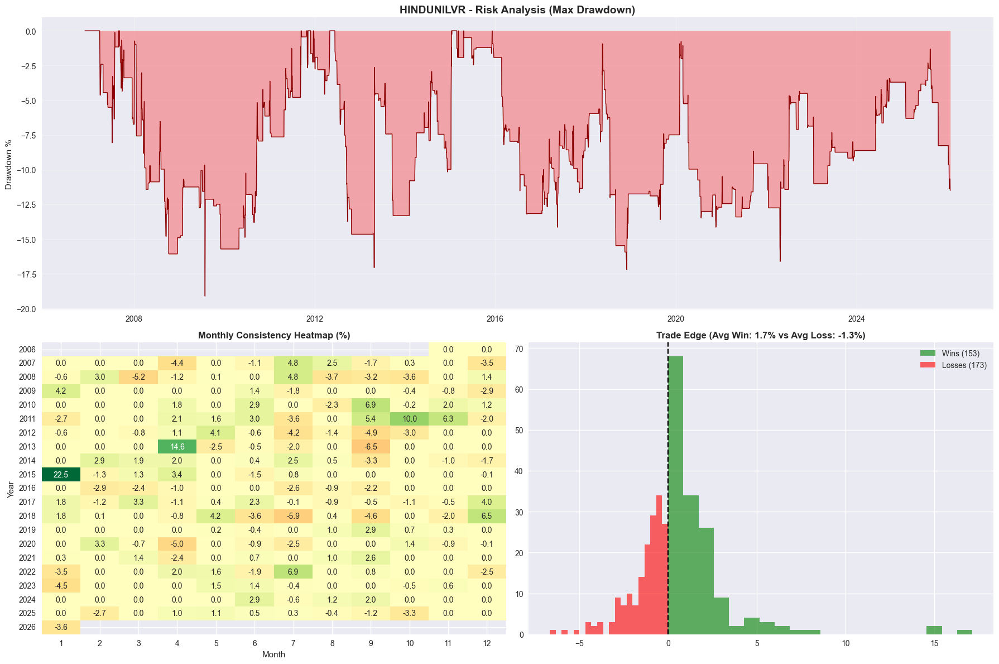

✅ Saved Quant Report: plots/TITAN_Quant_Report.png


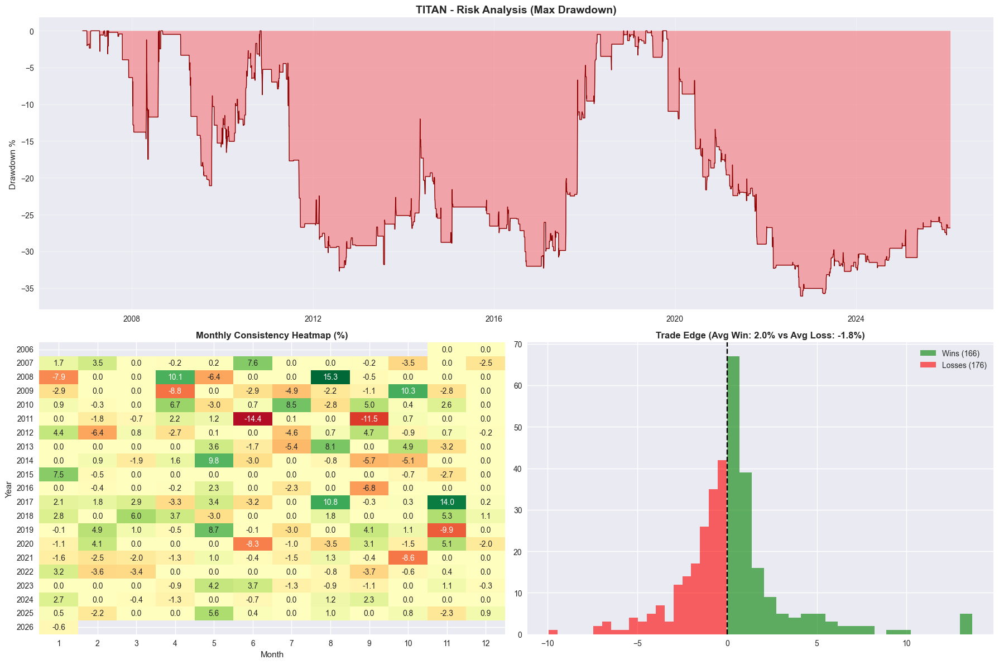

✅ Saved Quant Report: plots/UNITDSPR_Quant_Report.png


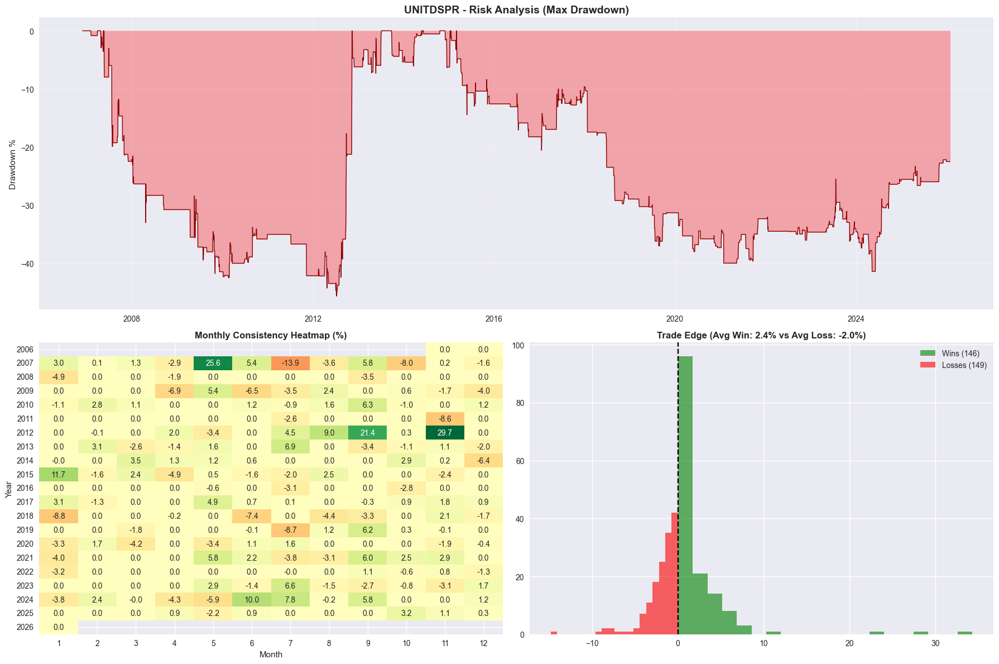

✅ Saved Quant Report: plots/ICICIBANK_Quant_Report.png


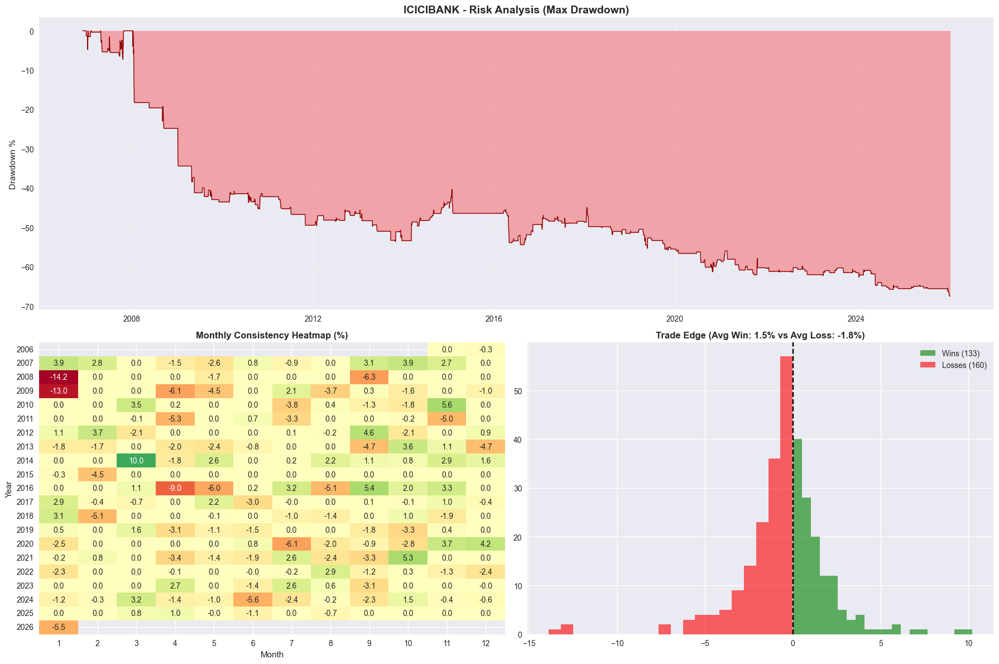

✅ Saved Quant Report: plots/SBIN_Quant_Report.png


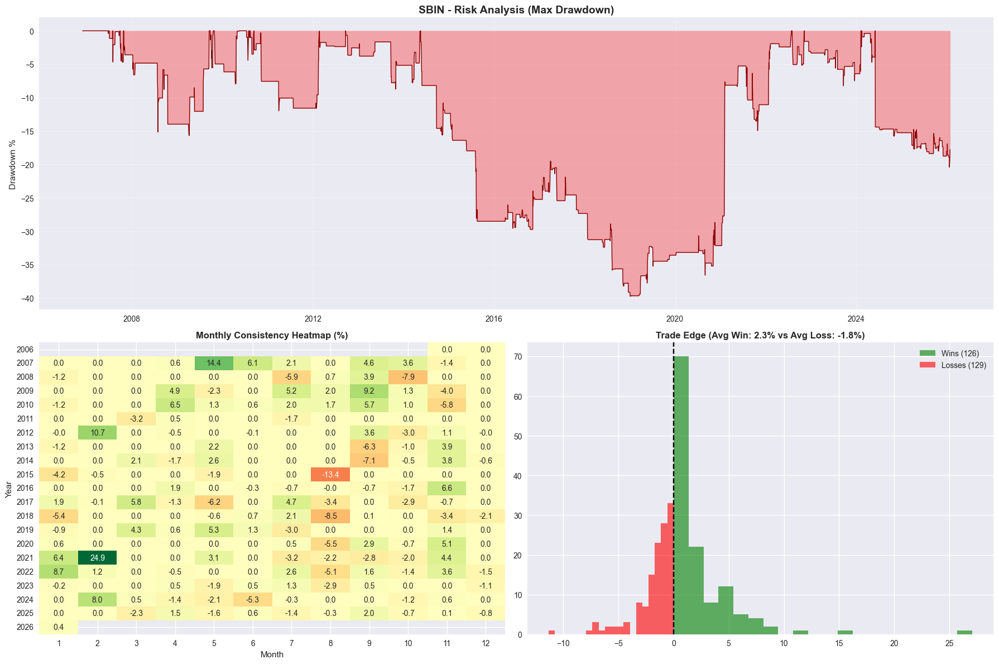

✅ Saved Quant Report: plots/MARUTI_Quant_Report.png


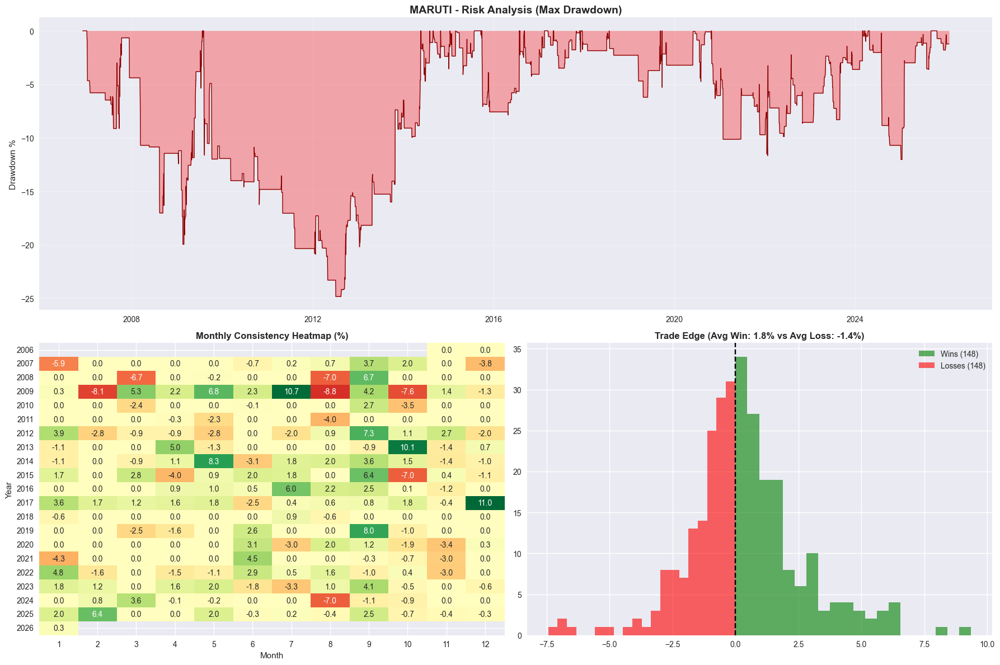

✅ Saved Quant Report: plots/LT_Quant_Report.png


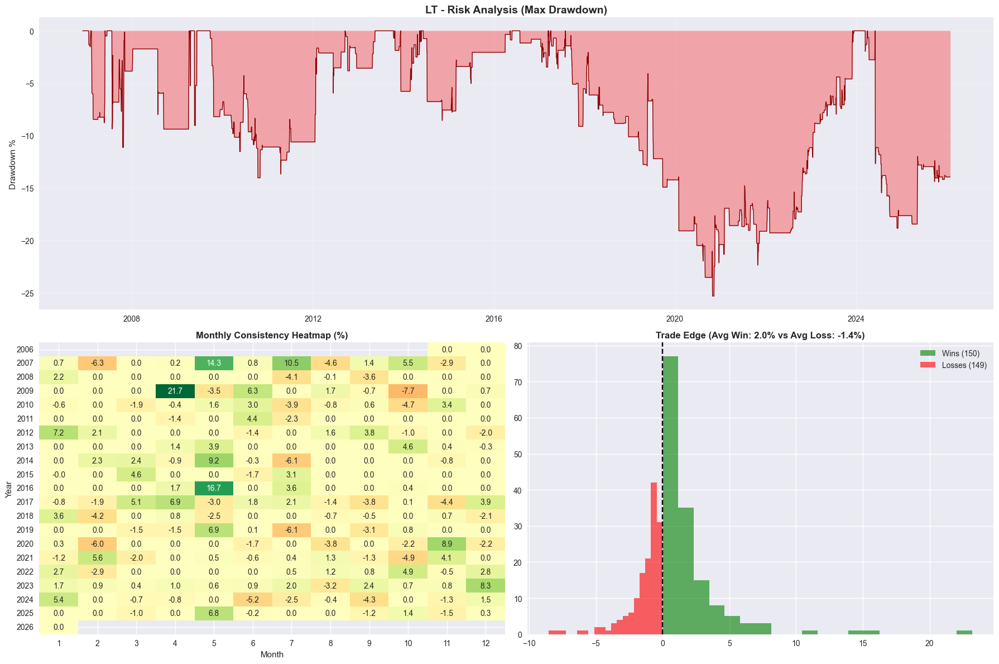

✅ Saved Quant Report: plots/TATASTEEL_Quant_Report.png


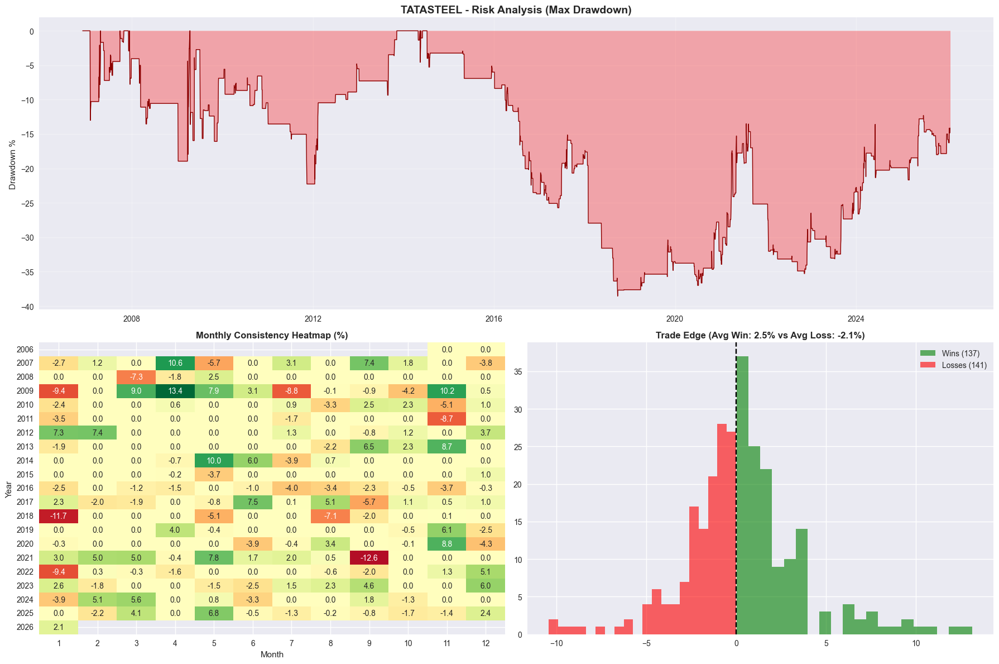

✅ Saved Quant Report: plots/ITC_Quant_Report.png


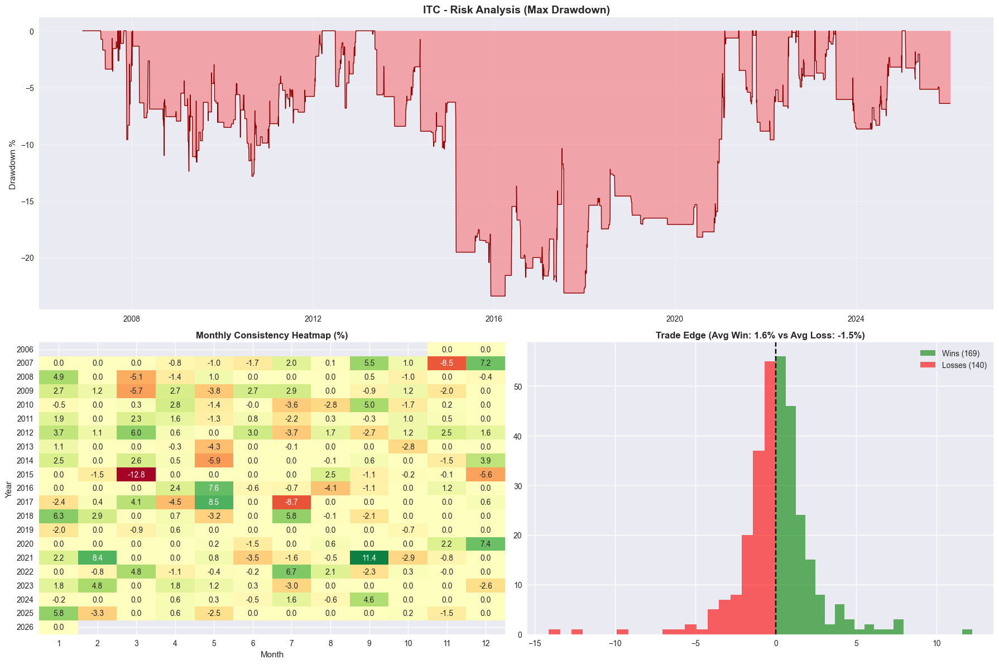

✅ Saved Quant Report: plots/NTPC_Quant_Report.png


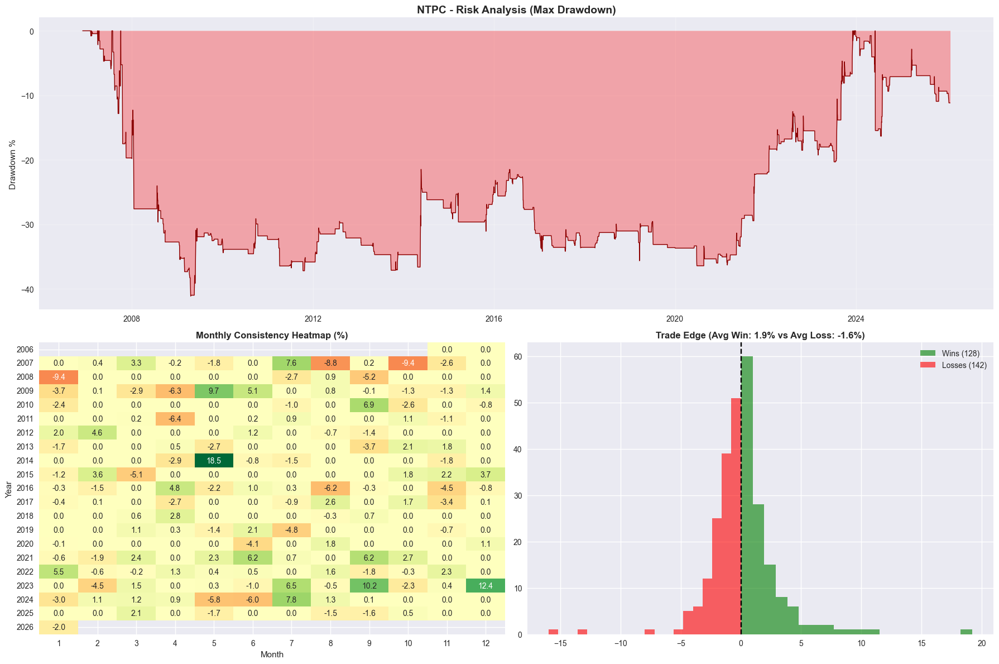

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns 
import os 


def plot_quant_stats(symbol):
    # 1. Ensure the output folder exists (THE FIX)
    if not os.path.exists("plots"):
        os.makedirs("plots")

    try:
        path = f"data/split/{symbol}.csv"
        df = pd.read_csv(path)
    except:
        print(f"❌ Data not found for {symbol}")
        return

    # --- 2. RE-RUN STRATEGY ---
    df.columns = [c.lower().strip() for c in df.columns]
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values('date', inplace=True)
    df.set_index('date', inplace=True) 
    
    # Indicators
    df['EMA_13'] = df['close'].ewm(span=13, adjust=False).mean()
    df['EMA_34'] = df['close'].ewm(span=34, adjust=False).mean()
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(14).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # Signal
    df['Signal'] = 0
    is_index = any(x in symbol.upper() for x in ['NIFTY', 'BANKNIFTY', 'FINNIFTY'])
    
    if is_index:
        df['StdDev'] = df['close'].rolling(20).std()
        df['Avg_StdDev'] = df['StdDev'].rolling(50).mean()
        long = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['StdDev'] > df['Avg_StdDev'])
        short = (df['EMA_13'] < df['EMA_34']) & (df['RSI'] < 50) & (df['StdDev'] > df['Avg_StdDev'])
        df.loc[long, 'Signal'] = 1
        df.loc[short, 'Signal'] = -1
    else:
        df['Vol_Avg'] = df['volume'].rolling(20).mean()
        long = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['volume'] > df['Vol_Avg'] * 1.2)
        df.loc[long, 'Signal'] = 1

    # --- 3. CALCULATE METRICS ---
    df['pct_change'] = df['close'].pct_change()
    df['Strategy_Ret'] = df['Signal'].shift(1) * df['pct_change']
    df['Equity'] = (1 + df['Strategy_Ret']).cumprod()
    
    # A. Drawdown
    df['Peak'] = df['Equity'].cummax()
    df['Drawdown'] = (df['Equity'] - df['Peak']) / df['Peak']
    
    # B. Trades (For Distribution)
    trades = []
    entry_price = 0
    signal = 0
    for i in range(1, len(df)):
        # If signal changed
        if df['Signal'].iloc[i] != df['Signal'].iloc[i-1]:
            # Close previous trade
            if df['Signal'].iloc[i-1] != 0: 
                exit_price = df['close'].iloc[i]
                # PnL Calculation
                pnl = (exit_price - entry_price) / entry_price if signal == 1 else (entry_price - exit_price) / entry_price
                trades.append(pnl * 100)
            # Open new trade
            if df['Signal'].iloc[i] != 0: 
                entry_price = df['close'].iloc[i]
                signal = df['Signal'].iloc[i]
    
 
    fig = plt.figure(figsize=(18, 12))
    gs = fig.add_gridspec(2, 2)
    
    # Panel 1: Underwater Plot
    ax1 = fig.add_subplot(gs[0, :])
    ax1.fill_between(df.index, df['Drawdown'] * 100, 0, color='red', alpha=0.3)
    ax1.plot(df.index, df['Drawdown'] * 100, color='darkred', lw=1)
    ax1.set_title(f"{symbol} - Risk Analysis (Max Drawdown)", fontsize=14, fontweight='bold')
    ax1.set_ylabel("Drawdown %")
    ax1.grid(True, alpha=0.3)
    
    # Panel 2: Heatmap
    ax2 = fig.add_subplot(gs[1, 0])
    monthly_ret = df['Strategy_Ret'].resample('ME').sum() * 100 # Updated to 'ME' for future-proofing
    monthly_ret = monthly_ret.to_frame(name='Return')
    monthly_ret['Year'] = monthly_ret.index.year
    monthly_ret['Month'] = monthly_ret.index.month
    heatmap_data = monthly_ret.pivot(index='Year', columns='Month', values='Return')
    
    sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap="RdYlGn", center=0, ax=ax2, cbar=False)
    ax2.set_title("Monthly Consistency Heatmap (%)", fontsize=12, fontweight='bold')
    
    # Panel 3: Distribution
    ax3 = fig.add_subplot(gs[1, 1])
    if trades:
        wins = [t for t in trades if t > 0]
        losses = [t for t in trades if t <= 0]
        ax3.hist(wins, bins=20, color='green', alpha=0.6, label=f'Wins ({len(wins)})')
        ax3.hist(losses, bins=20, color='red', alpha=0.6, label=f'Losses ({len(losses)})')
        ax3.axvline(0, color='black', linestyle='--')
        
        avg_win = np.mean(wins) if wins else 0
        avg_loss = np.mean(losses) if losses else 0
        ax3.set_title(f"Trade Edge (Avg Win: {avg_win:.1f}% vs Avg Loss: {avg_loss:.1f}%)", fontsize=12, fontweight='bold')
        ax3.legend()
    else:
        ax3.text(0.5, 0.5, "No completed trades yet", ha='center')

    plt.tight_layout()
    
    # Save File
    filename = f"plots/{symbol}_Quant_Report.png"
    plt.savefig(filename)
    print(f"✅ Saved Quant Report: {filename}")
    plt.show()

# Run it
plot_quant_stats("NIFTY")
plot_quant_stats("RELIANCE")
plot_quant_stats("ONGC")      
plot_quant_stats("BANKNIFTY")
plot_quant_stats("FINNIFTY")      
plot_quant_stats("MRF")
plot_quant_stats("HDFCBANK")      
plot_quant_stats("TCS")
plot_quant_stats("INFY")      
plot_quant_stats("HINDUNILVR")
plot_quant_stats("TITAN")      
plot_quant_stats("UNITDSPR")
plot_quant_stats("ICICIBANK")      
plot_quant_stats("SBIN")
plot_quant_stats("MARUTI")      
plot_quant_stats("LT")
plot_quant_stats("TATASTEEL")      
plot_quant_stats("ITC")
plot_quant_stats("NTPC")

In [ ]:
import pandas as pd
import numpy as np
import os
import glob

# 1. Setup Output Folder
OUTPUT_DIR = "metrics"
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

print(f"📊 Generating Data Logs in: {OUTPUT_DIR}/ ...")

# Storage for Final CSVs
leaderboard_data = []
all_trades_log = []

def calculate_metrics(filepath):
    symbol = os.path.basename(filepath).replace(".csv", "")
    
    try:
        df = pd.read_csv(filepath)
    except:
        return

    # --- 1. STRATEGY RE-RUN ---
    df.columns = [c.lower().strip() for c in df.columns]
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values('date', inplace=True)
    df.reset_index(drop=True, inplace=True)

    # Indicators
    df['EMA_13'] = df['close'].ewm(span=13, adjust=False).mean()
    df['EMA_34'] = df['close'].ewm(span=34, adjust=False).mean()
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(14).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # Signal Logic
    df['Signal'] = 0
    is_index = any(x in symbol.upper() for x in ['NIFTY', 'BANKNIFTY', 'FINNIFTY'])
    
    if is_index:
        df['StdDev'] = df['close'].rolling(20).std()
        df['Avg_StdDev'] = df['StdDev'].rolling(50).mean()
        long = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['StdDev'] > df['Avg_StdDev'])
        short = (df['EMA_13'] < df['EMA_34']) & (df['RSI'] < 50) & (df['StdDev'] > df['Avg_StdDev'])
        df.loc[long, 'Signal'] = 1
        df.loc[short, 'Signal'] = -1
    else:
        df['Vol_Avg'] = df['volume'].rolling(20).mean()
        long = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['volume'] > df['Vol_Avg'] * 1.2)
        df.loc[long, 'Signal'] = 1

    # --- 2. EXTRACT TRADES ---
    entry_price = 0
    entry_date = None
    signal = 0
    trades = [] # For this asset only
    
    for i in range(1, len(df)):
        # Check for Signal Change
        if df['Signal'].iloc[i] != df['Signal'].iloc[i-1]:
            
            # A. CLOSE EXISTING TRADE
            if df['Signal'].iloc[i-1] != 0: 
                exit_price = df['close'].iloc[i]
                exit_date = df['date'].iloc[i]
                
                # Calculate PnL
                if signal == 1: # Long
                    pnl_pct = ((exit_price - entry_price) / entry_price) * 100
                    direction = "LONG"
                else: # Short
                    pnl_pct = ((entry_price - exit_price) / entry_price) * 100
                    direction = "SHORT"
                
                trades.append(pnl_pct)
                
                # Log to Master List
                all_trades_log.append({
                    'Asset': symbol,
                    'Entry_Date': entry_date,
                    'Exit_Date': exit_date,
                    'Direction': direction,
                    'Entry_Price': round(entry_price, 2),
                    'Exit_Price': round(exit_price, 2),
                    'PnL_Pct': round(pnl_pct, 2)
                })

            # B. OPEN NEW TRADE
            if df['Signal'].iloc[i] != 0: 
                entry_price = df['close'].iloc[i]
                entry_date = df['date'].iloc[i]
                signal = df['Signal'].iloc[i]

    # --- 3. CALCULATE ASSET STATS ---
    if trades:
        total_ret = sum(trades)
        win_rate = len([t for t in trades if t > 0]) / len(trades) * 100
        avg_win = np.mean([t for t in trades if t > 0]) if any(t > 0 for t in trades) else 0
        
        # Max Drawdown Calculation
        df['Strategy_Ret'] = df['Signal'].shift(1) * df['close'].pct_change()
        df['Equity'] = (1 + df['Strategy_Ret']).cumprod()
        peak = df['Equity'].cummax()
        dd = ((df['Equity'] - peak) / peak).min() * 100
        
        leaderboard_data.append({
            'Asset': symbol,
            'Total_Return_Pct': round(total_ret, 2),
            'Max_Drawdown_Pct': round(dd, 2),
            'Win_Rate_Pct': round(win_rate, 2),
            'Total_Trades': len(trades),
            'Avg_Win_Pct': round(avg_win, 2)
        })
    else:
        # No trades case
        leaderboard_data.append({
            'Asset': symbol, 'Total_Return_Pct': 0, 'Max_Drawdown_Pct': 0,
            'Win_Rate_Pct': 0, 'Total_Trades': 0, 'Avg_Win_Pct': 0
        })

# --- EXECUTION ---
files = glob.glob("data/split/*.csv")
for f in files:
    calculate_metrics(f)

# --- SAVE TO CSV ---
# 1. Leaderboard
df_leaderboard = pd.DataFrame(leaderboard_data)
# Sort by highest return
df_leaderboard.sort_values('Total_Return_Pct', ascending=False, inplace=True)
df_leaderboard.to_csv(f"{OUTPUT_DIR}/Final_Leaderboard.csv", index=False)

# 2. Trade Log
df_log = pd.DataFrame(all_trades_log)
df_log.sort_values('Entry_Date', inplace=True)
df_log.to_csv(f"{OUTPUT_DIR}/Master_Trade_Log.csv", index=False)

print("-" * 50)
print(f"✅ Saved 'Final_Leaderboard.csv' (Summary of all assets)")
print(f"✅ Saved 'Master_Trade_Log.csv' (Every single trade detail)")
print(f"📂 Check folder: {OUTPUT_DIR}/")

📊 Generating Data Logs in: metrics/ ...
--------------------------------------------------
✅ Saved 'Final_Leaderboard.csv' (Summary of all assets)
✅ Saved 'Master_Trade_Log.csv' (Every single trade detail)
📂 Check folder: metrics/


In [ ]:
import pandas as pd
import numpy as np
import os
import glob


OUTPUT_DIR = "metrics"
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

print(f"⚡ Generating clean Trade Log with SL & Targets...")

all_trades_log = []

def generate_rich_log(filepath):
    symbol = os.path.basename(filepath).replace(".csv", "")
    
    try:
        df = pd.read_csv(filepath)
    except:
        return

    # --- 1. DATA PREP ---
    df.columns = [c.lower().strip() for c in df.columns]
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values('date', inplace=True)
    df.reset_index(drop=True, inplace=True)

    # --- 2. INDICATORS ---
    df['EMA_13'] = df['close'].ewm(span=13, adjust=False).mean()
    df['EMA_34'] = df['close'].ewm(span=34, adjust=False).mean()
    
    # RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(14).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # --- 3. SIGNAL LOGIC ---
    df['Signal'] = 0
    is_index = any(x in symbol.upper() for x in ['NIFTY', 'BANKNIFTY', 'FINNIFTY'])
    
    if is_index:
        df['StdDev'] = df['close'].rolling(20).std()
        df['Avg_StdDev'] = df['StdDev'].rolling(50).mean()
        long = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['StdDev'] > df['Avg_StdDev'])
        short = (df['EMA_13'] < df['EMA_34']) & (df['RSI'] < 50) & (df['StdDev'] > df['Avg_StdDev'])
        df.loc[long, 'Signal'] = 1
        df.loc[short, 'Signal'] = -1
        asset_type = "INDEX"
    else:
        df['Vol_Avg'] = df['volume'].rolling(20).mean()
        long = (df['EMA_13'] > df['EMA_34']) & (df['RSI'] > 50) & (df['volume'] > df['Vol_Avg'] * 1.2)
        df.loc[long, 'Signal'] = 1
        asset_type = "STOCK"

    entry_price = 0
    entry_date = None
    signal = 0
    
    for i in range(1, len(df)):
        if df['Signal'].iloc[i] != df['Signal'].iloc[i-1]:
            
            # CLOSE TRADE
            if df['Signal'].iloc[i-1] != 0: 
                exit_price = df['close'].iloc[i]
                exit_date = df['date'].iloc[i]
                
                # Logic for SL/Target (Matches your Charts)
                # Risk is approx 3% of entry price
                risk_amt = entry_price * 0.03
                
                if signal == 1: # LONG
                    direction = "LONG"
                    sl = entry_price - risk_amt
                    tgt = entry_price + (2 * risk_amt)
                    pnl = (exit_price - entry_price)
                    status = "WIN" if exit_price > entry_price else "LOSS"
                else: # SHORT
                    direction = "SHORT"
                    sl = entry_price + risk_amt
                    tgt = entry_price - (2 * risk_amt)
                    pnl = (entry_price - exit_price)
                    status = "WIN" if exit_price < entry_price else "LOSS"

                # Log It
                all_trades_log.append({
                    'Symbol': symbol,
                    'Type': asset_type,
                    'Direction': direction,
                    'Entry_Date': entry_date.strftime('%Y-%m-%d'),
                    'Exit_Date': exit_date.strftime('%Y-%m-%d'),
                    'Entry_Price': round(entry_price, 2),
                    'Exit_Price': round(exit_price, 2),
                    'Stop_Loss': round(sl, 2),
                    'Target': round(tgt, 2),
                    'PnL': round(pnl, 2),
                    'Result': status
                })

            # OPEN TRADE
            if df['Signal'].iloc[i] != 0: 
                entry_price = df['close'].iloc[i]
                entry_date = df['date'].iloc[i]
                signal = df['Signal'].iloc[i]

# --- EXECUTION ---
files = glob.glob("data/split/*.csv")
for f in files:
    generate_rich_log(f)

# Save
df_final = pd.DataFrame(all_trades_log)
df_final.sort_values('Entry_Date', inplace=True)
outfile = f"{OUTPUT_DIR}/Final_Submission_Log.csv"
df_final.to_csv(outfile, index=False)

print("-" * 50)
print(f"✅ Success! Created '{outfile}'")
print(f"   Contains {len(df_final)} trades with SL, Target, and clean dates.")

⚡ Generating clean Trade Log with SL & Targets...
--------------------------------------------------
✅ Success! Created 'metrics/Final_Submission_Log.csv'
   Contains 5291 trades with SL, Target, and clean dates.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os


# 1. Output Folder
OUTPUT_DIR = "index_analysis"
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

print(f"📊 Generating All 3 Index Charts in: {OUTPUT_DIR}/ ...")
print("-" * 50)

def generate_all_index_charts():
    # 2. Robust File Loading
    if os.path.exists("metrics/Final_Submission_Log.csv"):
        file_path = "metrics/Final_Submission_Log.csv"
    elif os.path.exists("Final_Submission_Log.csv"):
        file_path = "Final_Submission_Log.csv"
    else:
        print("❌ Error: Could not find 'Final_Submission_Log.csv'.")
        return

    df = pd.read_csv(file_path)

    # 3. Filter for Indices Only
    indices = ['NIFTY', 'BANKNIFTY', 'FINNIFTY']
    df_idx = df[df['Symbol'].str.upper().isin(indices)].copy()
    
    if df_idx.empty:
        print("❌ No index data found to plot.")
        return

    # Set Global Style
    sns.set_style("whitegrid")
    colors = ['#27ae60', '#c0392b'] # Green = LONG, Red = SHORT

    # ===============================
    # CHART 1: CUMULATIVE PIE CHART
    # ===============================
    plt.figure(figsize=(8, 8))
    counts = df_idx['Direction'].value_counts()
    
    plt.pie(counts, labels=counts.index, autopct='%1.1f%%', 
            colors=colors, startangle=140, explode=(0.05, 0), shadow=True)
    
    plt.title('Total Position Split (All Indices)', fontsize=14, fontweight='bold')
    save_path_1 = f"{OUTPUT_DIR}/1_Cumulative_Index_Pie_Chart.png"
    plt.savefig(save_path_1)
    plt.close()
    print(f"✅ Saved Chart 1: {save_path_1}")

    # ===============================
    # CHART 2: PER-INDEX BAR CHART
    # ===============================
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=df_idx, x='Symbol', hue='Direction', 
                       palette={'LONG': '#27ae60', 'SHORT': '#c0392b'},
                       order=indices) 
    
    plt.title('Long vs Short Count per Index', fontsize=14, fontweight='bold')
    plt.xlabel("Index Name")
    plt.ylabel("Number of Trades")
    
    # Add counts on top
    for p in ax.patches:
        if p.get_height() > 0:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', va='center', xytext=(0, 5), textcoords='offset points')

    save_path_2 = f"{OUTPUT_DIR}/2_Per_Index_Bar_Chart.png"
    plt.savefig(save_path_2)
    plt.close()
    print(f"✅ Saved Chart 2: {save_path_2}")

   
    # Data Processing
    df_idx['Year'] = pd.to_datetime(df_idx['Entry_Date']).dt.year
    pivot_counts = df_idx.groupby(['Year', 'Direction']).size().unstack(fill_value=0)
    pivot_pct = pivot_counts.div(pivot_counts.sum(axis=1), axis=0) * 100

    # Plotting
    ax = pivot_counts.plot(kind='bar', stacked=True, figsize=(16, 9), color=colors, width=0.8)

    # Add Percentage Labels
    for c in ax.containers:
        label = c.get_label() # 'LONG' or 'SHORT'
        
        for v in c:
            height = v.get_height()
            if height > 0:
                # Calculate coordinates
                x = v.get_x() + v.get_width() / 2
                y = v.get_y() + height / 2
                
                # Identify the Year Index
                bar_index = int(v.get_x() + v.get_width() / 2)
                
                if 0 <= bar_index < len(pivot_counts):
                    year = pivot_counts.index[bar_index]
                    
                    if label in pivot_pct.columns:
                        pct_val = pivot_pct.loc[year, label]
                        # Only show text if bar segment is large enough
                        if height > 2: 
                            ax.text(x, y, f"{pct_val:.0f}%", ha='center', va='center', 
                                    color='white', fontweight='bold', fontsize=9)

    plt.title('Strategy Adaptation: Long vs Short Allocations (Indices)', fontsize=18, fontweight='bold', pad=20)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Number of Trades', fontsize=12)
    plt.legend(title='Position Type', loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    save_path_3 = f"{OUTPUT_DIR}/3_Yearly_Index_Trend_With_Pct.png"
    plt.savefig(save_path_3)
    plt.close()
    print(f"✅ Saved Chart 3: {save_path_3}")

# Run All
generate_all_index_charts()
print("-" * 50)
print(f"🚀 SUCCESS! All 3 charts are ready in '{OUTPUT_DIR}/'")

📊 Generating All 3 Index Charts in: index_analysis/ ...
--------------------------------------------------
✅ Saved Chart 1: index_analysis/1_Cumulative_Index_Pie_Chart.png
✅ Saved Chart 2: index_analysis/2_Per_Index_Bar_Chart.png
✅ Saved Chart 3: index_analysis/3_Yearly_Index_Trend_With_Pct.png
--------------------------------------------------
🚀 SUCCESS! All 3 charts are ready in 'index_analysis/'
